# Import

In [1]:
import os

os.environ["KMP_DUPLICATE_LIB_OK"] = "True"

from nes_py.wrappers import JoypadSpace
import torch
import numpy as np
import gym
import gym_super_mario_bros
from gym.wrappers import (
    FrameStack,
    GrayScaleObservation,
    ResizeObservation,
    TransformObservation,
    Monitor,
)

# Import own Functions
from src.helper_functions.create_Plot import plot_results
from src.helper_functions.create_Agent import MarioAgentEpsilonGreedy

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Set Hyperparameters

In [2]:
action_space = [
    ["NOOP"],
    ["A"],
    ["B"],
    ["right"],
    ["left"],
    ["right", "A"],
    ["right", "B"],
    ["right", "A", "B"],
]
buffer_size = 25000
batch_size = 64
learning_rate = 0.00009
stacking_number = 10
online_update_every = 3
exp_before_target_sync = 5000
epsilon_start = 1.0
epsilon_min = 0.01
epsilon_decay = 0.001
gamma = 0.99
num_episodes = 1000
plot_every = 25
save_every = 50

# Set all Paths

In [3]:
# change this version-number to create new folders
train_version = "v3"

trainfolder = "training_" + train_version
vid_folder = os.path.join("res", trainfolder, "all_videos")

model_folder = os.path.join("models")
if not os.path.exists(model_folder):
    os.makedirs(model_folder)

checkpoint_folder = os.path.join(model_folder, trainfolder, "checkpoints")
if not os.path.exists(checkpoint_folder):
    os.makedirs(checkpoint_folder)

plot_folder = os.path.join("res", trainfolder, "plots")
if not os.path.exists(plot_folder):
    os.makedirs(plot_folder)

starting_point = None  # os.path.join(checkpoint_folder, "model_ep850.pth")

# Initialize Environment and other variables

In [4]:
exp_before_training = batch_size + 5

env = gym_super_mario_bros.make("SuperMarioBros-1-1-v0")
env = JoypadSpace(env, action_space)
env = Monitor(env, vid_folder, video_callable=lambda episode_id: True, force=True)
env = GrayScaleObservation(env, keep_dim=False)
env = ResizeObservation(env, shape=84)
env = TransformObservation(env, lambda obs: np.squeeze(obs, axis=-1))
env = TransformObservation(env, f=lambda x: x / 255.0)
env = FrameStack(env, num_stack=stacking_number)

state = env.reset()
state_shape = state.shape


mario = MarioAgentEpsilonGreedy(
    num_actions=len(action_space),
    state_shape=state_shape,
    checkpoint_folder=checkpoint_folder,
    model_folder=model_folder,
    wantcuda=True,
    starting_point=starting_point,
    learning_rate=learning_rate,
    epsilon_start=epsilon_start,
    epsilon_min=epsilon_min,
    epsilon_decay=epsilon_decay,
    batch_size=batch_size,
    gamma=gamma,
    buffer_size=buffer_size,
    exp_before_training=exp_before_training,
    online_update_every=online_update_every,
    exp_before_target_sync=exp_before_target_sync,
    save_every=save_every,
)

reward_list = []
steps_list = []
q_list = []
loss_list = []
epsilon_list = []

# Start the training

c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\AML\Abgaben\Coding\Reinforcement-Learning\src\helper_functions\create_Agent.py:104: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ..\torch\csrc\utils\tensor_new.cpp:277.)
  state = torch.tensor(state, dtype=torch.float32, device=self.device)
c:\Users\nicho\OneDrive\Dokumente\A - DHBW\6. Semester\AML\Abgaben\Coding\Reinforcement-Learning\venv\Lib\site-packages\gym_super_mario_bros\smb_env.py:148: RuntimeWarning: overflow encountered in scalar subtract
  return (self.ram[0x86] - self.ram[0x071c]) % 256


Episode 1 abgeschlossen mit 198 Schritten, Gesamtbelohnung: 229.0, Epsilon: 1.0


Episode 2 abgeschlossen mit 186 Schritten, Gesamtbelohnung: 230.0, Epsilon: 0.999


Episode 3 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 139.0, Epsilon: 0.998


Episode 4 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 139.0, Epsilon: 0.997


Episode 5 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 139.0, Epsilon: 0.996


Episode 6 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 139.0, Epsilon: 0.995


Episode 7 abgeschlossen mit 170 Schritten, Gesamtbelohnung: 239.0, Epsilon: 0.994


Episode 8 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 139.0, Epsilon: 0.993


Episode 9 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 139.0, Epsilon: 0.992


Episode 10 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.991


Episode 11 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 139.0, Epsilon: 0.99


Episode 12 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 139.0, 

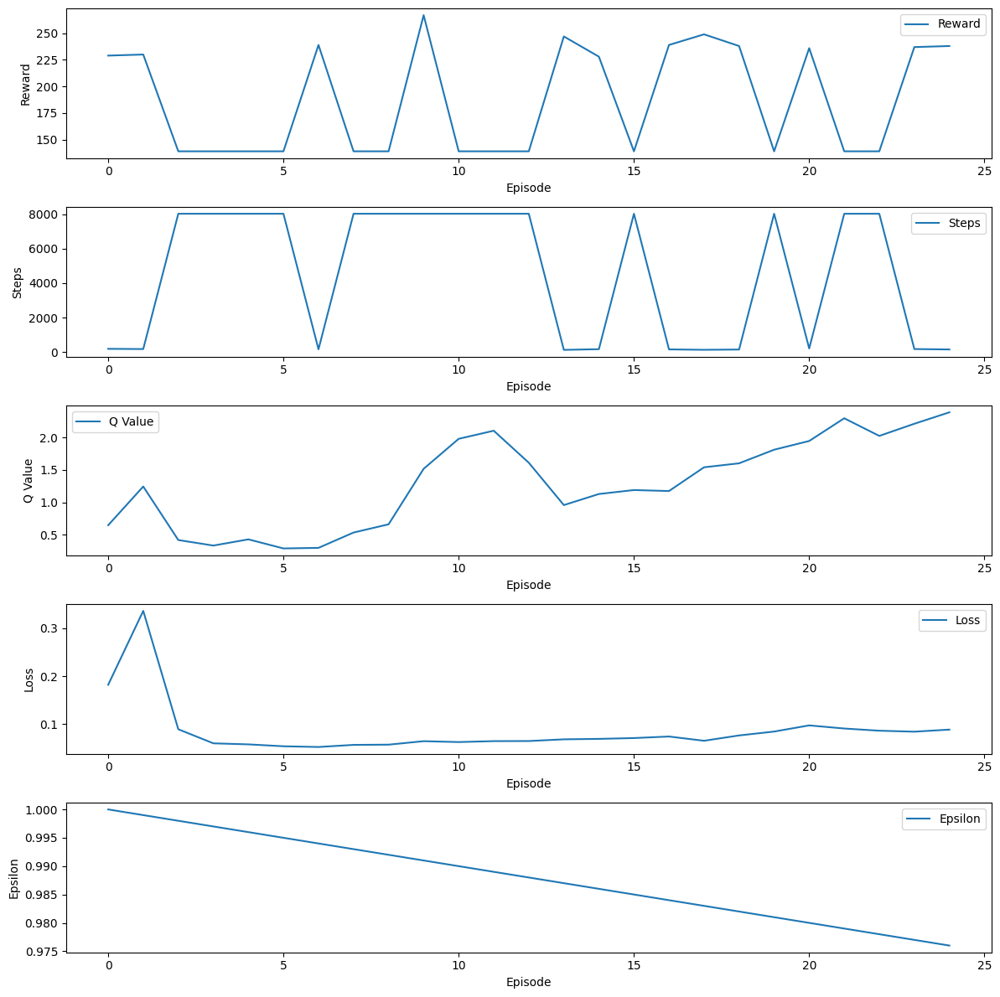

Episode 26 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 139.0, Epsilon: 0.975


Episode 27 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 139.0, Epsilon: 0.974


Episode 28 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 266.0, Epsilon: 0.973


Episode 29 abgeschlossen mit 6008 Schritten, Gesamtbelohnung: 367.0, Epsilon: 0.972


Episode 30 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 139.0, Epsilon: 0.971


Episode 31 abgeschlossen mit 160 Schritten, Gesamtbelohnung: 245.0, Epsilon: 0.97


Episode 32 abgeschlossen mit 172 Schritten, Gesamtbelohnung: 233.0, Epsilon: 0.969


Episode 33 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 139.0, Epsilon: 0.968


Episode 34 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.967


Episode 35 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 139.0, Epsilon: 0.966


Episode 36 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 139.0, Epsilon: 0.965


Episode 37 abgeschlossen mit 8019 Schritten, Gesamtbelohn

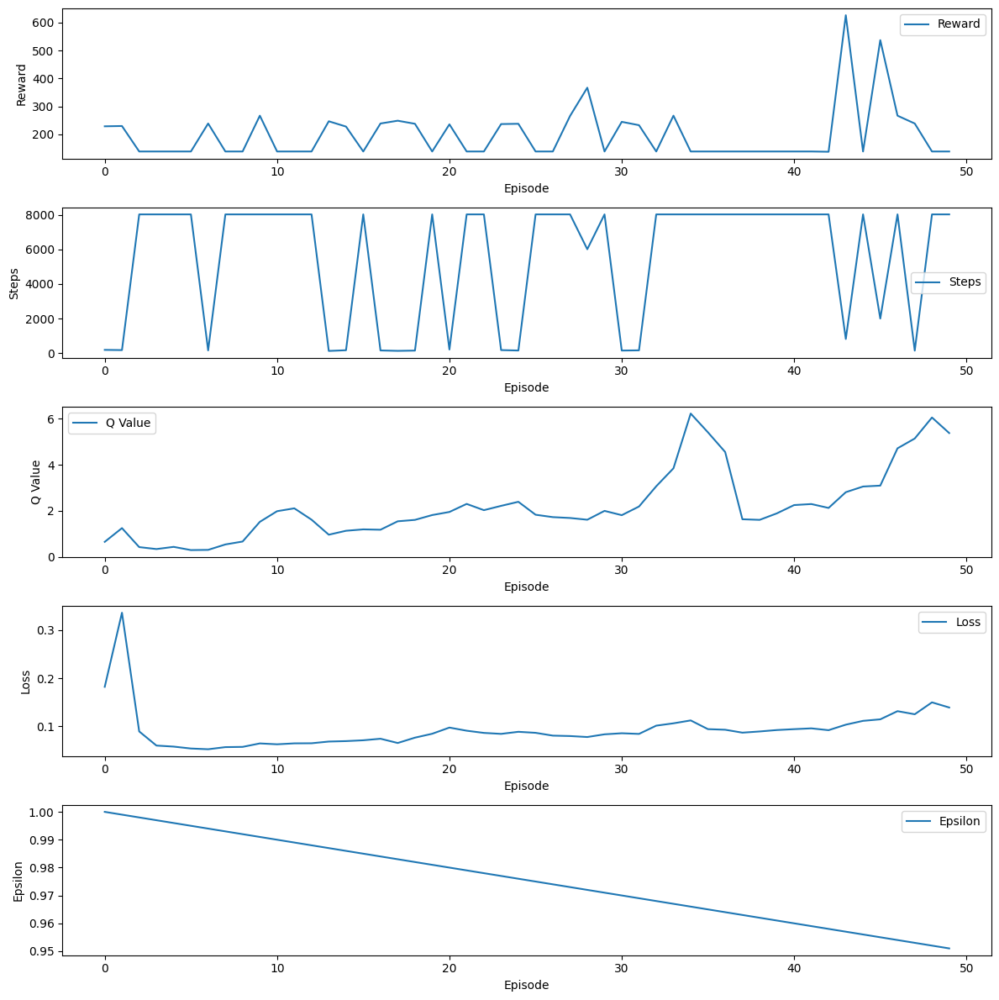

Episode 51 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 139.0, Epsilon: 0.95


Episode 52 abgeschlossen mit 188 Schritten, Gesamtbelohnung: 232.0, Epsilon: 0.949


Episode 53 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 139.0, Epsilon: 0.948


Episode 54 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 139.0, Epsilon: 0.947


Episode 55 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 138.0, Epsilon: 0.946


Episode 56 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 139.0, Epsilon: 0.945


Episode 57 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 138.0, Epsilon: 0.944


Episode 58 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 139.0, Epsilon: 0.943


Episode 59 abgeschlossen mit 222 Schritten, Gesamtbelohnung: 227.0, Epsilon: 0.942


Episode 60 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.941


Episode 61 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 139.0, Epsilon: 0.94


Episode 62 abgeschlossen mit 8019 Schritten, Gesamtbelohnu

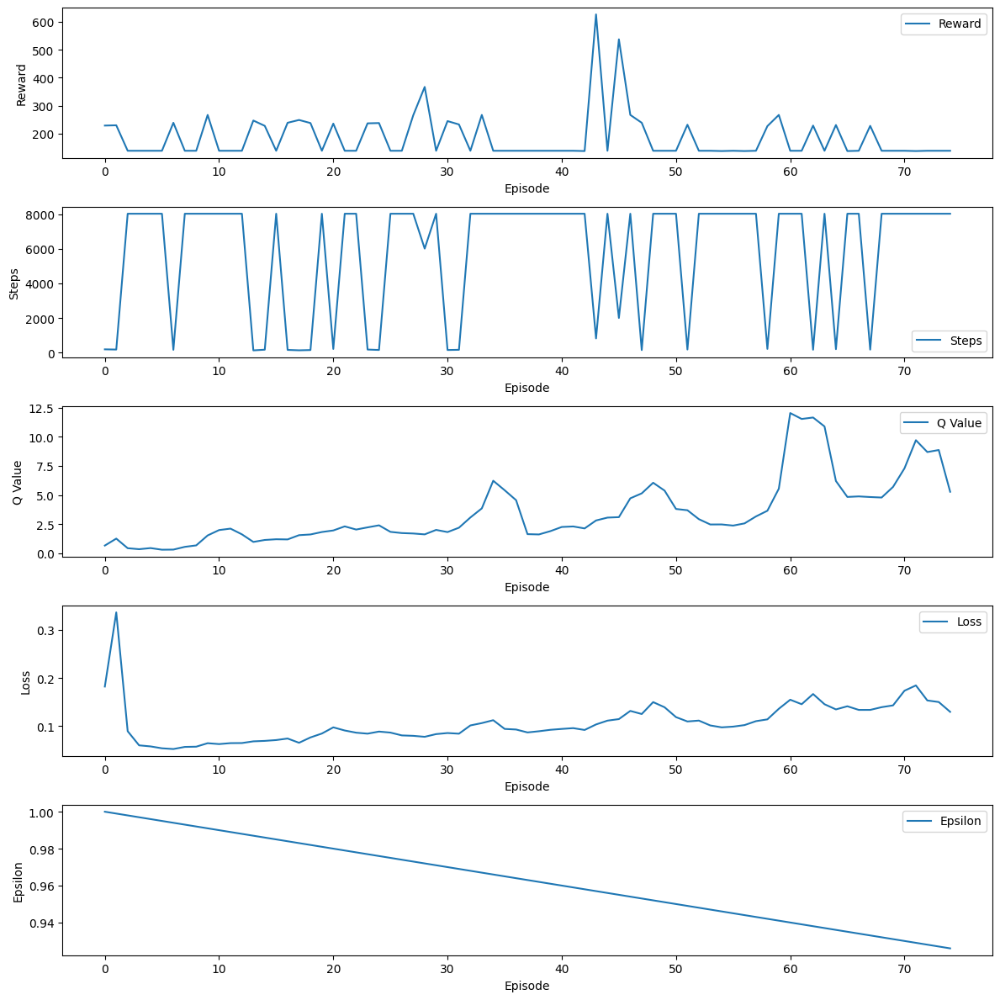

Episode 76 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.9249999999999999


Episode 77 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 139.0, Epsilon: 0.9239999999999999


Episode 78 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 139.0, Epsilon: 0.9229999999999999


Episode 79 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 139.0, Epsilon: 0.9219999999999999


Episode 80 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 139.0, Epsilon: 0.9209999999999999


Episode 81 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 138.0, Epsilon: 0.9199999999999999


Episode 82 abgeschlossen mit 266 Schritten, Gesamtbelohnung: 226.0, Epsilon: 0.9189999999999999


Episode 83 abgeschlossen mit 220 Schritten, Gesamtbelohnung: 230.0, Epsilon: 0.9179999999999999


Episode 84 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 139.0, Epsilon: 0.9169999999999999


Episode 85 abgeschlossen mit 8010 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.9159999999999999


Episode 86 a

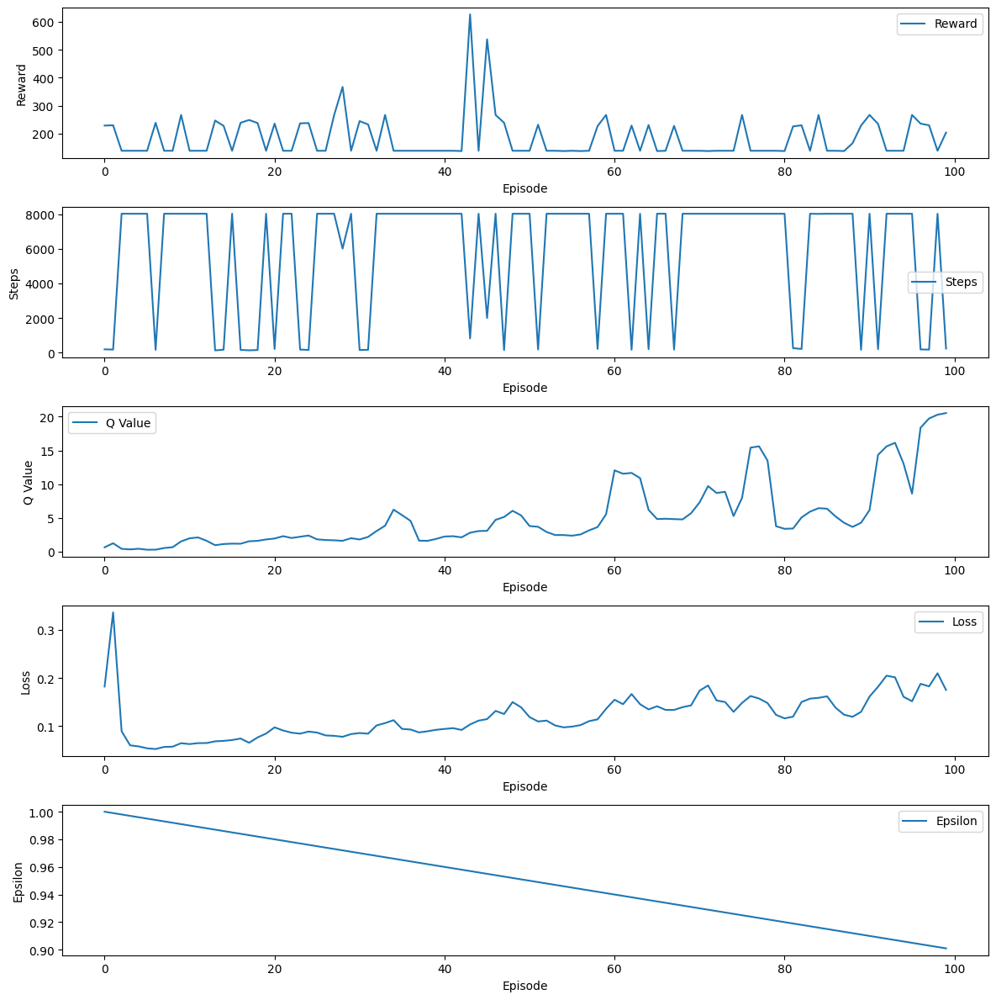

Episode 101 abgeschlossen mit 3080 Schritten, Gesamtbelohnung: 513.0, Epsilon: 0.8999999999999999


Episode 102 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 139.0, Epsilon: 0.8989999999999999


Episode 103 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 139.0, Epsilon: 0.8979999999999999


Episode 104 abgeschlossen mit 174 Schritten, Gesamtbelohnung: 229.0, Epsilon: 0.8969999999999999


Episode 105 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 139.0, Epsilon: 0.8959999999999999


Episode 106 abgeschlossen mit 198 Schritten, Gesamtbelohnung: 228.0, Epsilon: 0.8949999999999999


Episode 107 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 139.0, Epsilon: 0.8939999999999999


Episode 108 abgeschlossen mit 810 Schritten, Gesamtbelohnung: 595.0, Epsilon: 0.8929999999999999


Episode 109 abgeschlossen mit 8078 Schritten, Gesamtbelohnung: 138.0, Epsilon: 0.8919999999999999


Episode 110 abgeschlossen mit 168 Schritten, Gesamtbelohnung: 241.0, Epsilon: 0.8909999999999999


Epis

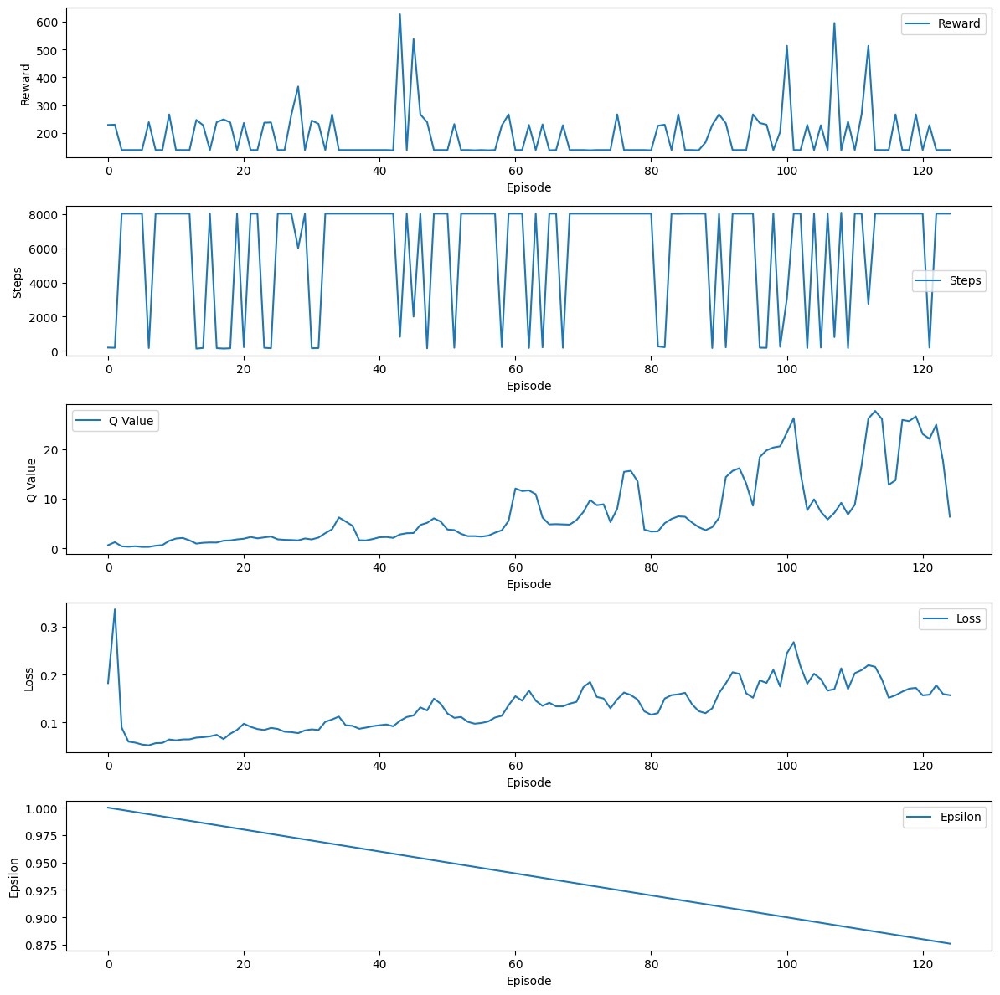

Episode 126 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.8749999999999999


Episode 127 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 139.0, Epsilon: 0.8739999999999999


Episode 128 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.8729999999999999


Episode 129 abgeschlossen mit 188 Schritten, Gesamtbelohnung: 244.0, Epsilon: 0.8719999999999999


Episode 130 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 139.0, Epsilon: 0.8709999999999999


Episode 131 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 137.0, Epsilon: 0.8699999999999999


Episode 132 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 138.0, Epsilon: 0.8689999999999999


Episode 133 abgeschlossen mit 180 Schritten, Gesamtbelohnung: 246.0, Epsilon: 0.8679999999999999


Episode 134 abgeschlossen mit 190 Schritten, Gesamtbelohnung: 228.0, Epsilon: 0.8669999999999999


Episode 135 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 138.0, Epsilon: 0.8659999999999999


Epi

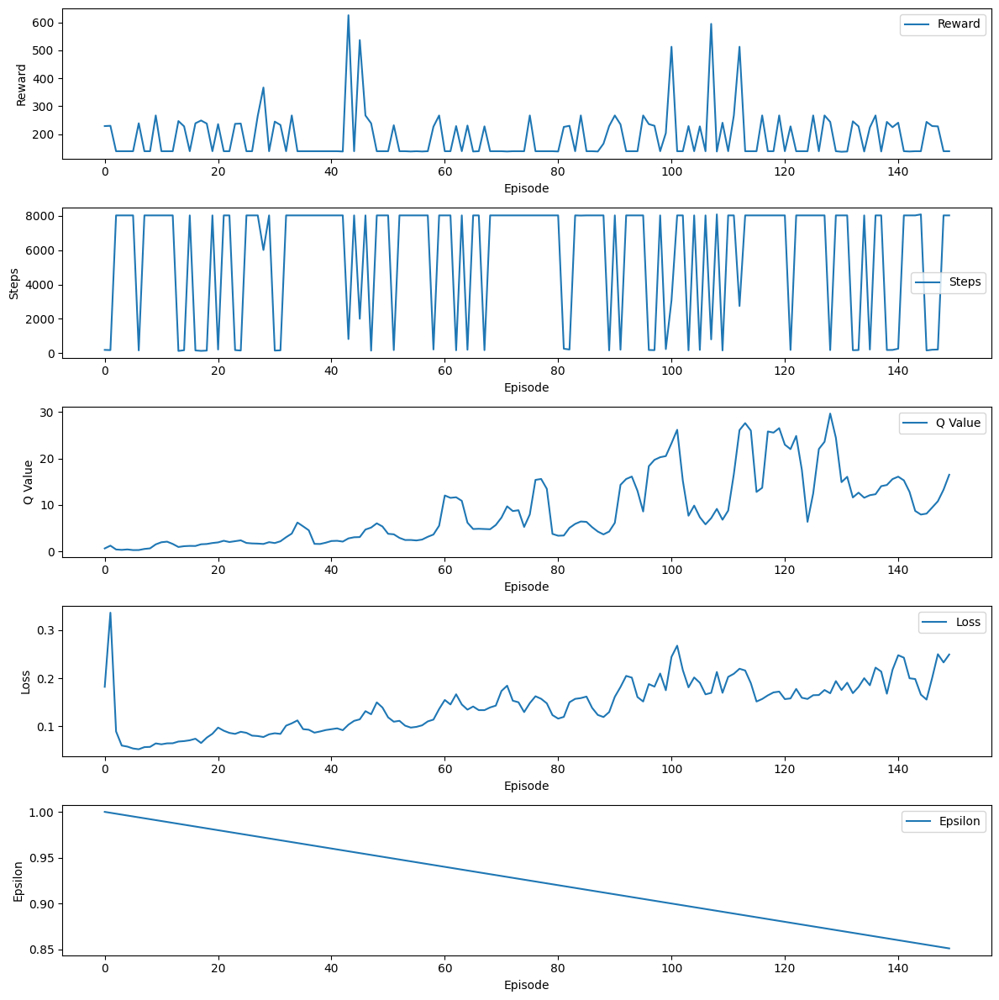

Episode 151 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 139.0, Epsilon: 0.8499999999999999


Episode 152 abgeschlossen mit 180 Schritten, Gesamtbelohnung: 236.0, Epsilon: 0.8489999999999999


Episode 153 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 139.0, Epsilon: 0.8479999999999999


Episode 154 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 138.0, Epsilon: 0.8469999999999999


Episode 155 abgeschlossen mit 186 Schritten, Gesamtbelohnung: 234.0, Epsilon: 0.8459999999999999


Episode 156 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 139.0, Epsilon: 0.8449999999999999


Episode 157 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.8439999999999999


Episode 158 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 139.0, Epsilon: 0.8429999999999999


Episode 159 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 139.0, Epsilon: 0.8419999999999999


Episode 160 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 139.0, Epsilon: 0.8409999999999999


Ep

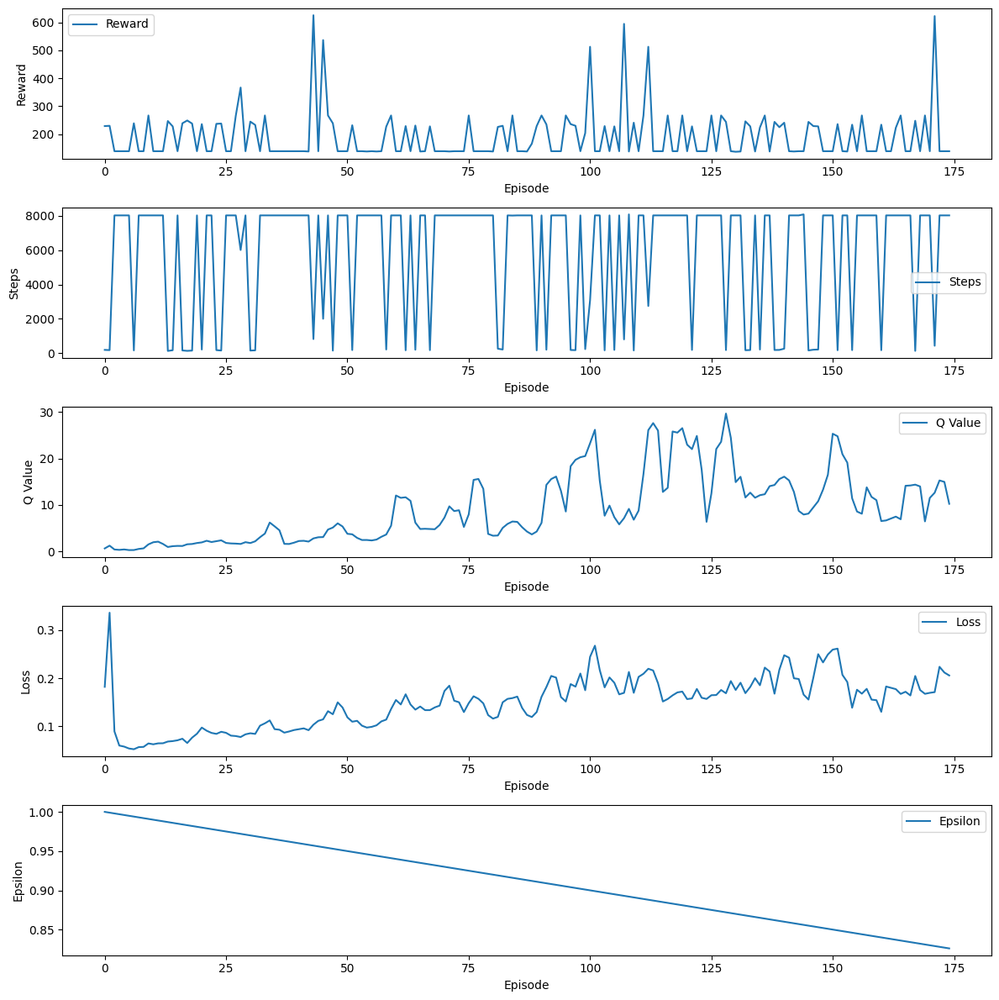

Episode 176 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 139.0, Epsilon: 0.8249999999999998


Episode 177 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 139.0, Epsilon: 0.8239999999999998


Episode 178 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 138.0, Epsilon: 0.8229999999999998


Episode 179 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 139.0, Epsilon: 0.8219999999999998


Episode 180 abgeschlossen mit 164 Schritten, Gesamtbelohnung: 235.0, Epsilon: 0.8209999999999998


Episode 181 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 139.0, Epsilon: 0.8199999999999998


Episode 182 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 136.0, Epsilon: 0.8189999999999998


Episode 183 abgeschlossen mit 176 Schritten, Gesamtbelohnung: 231.0, Epsilon: 0.8179999999999998


Episode 184 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 139.0, Epsilon: 0.8169999999999998


Episode 185 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 139.0, Epsilon: 0.8159999999999998


Ep

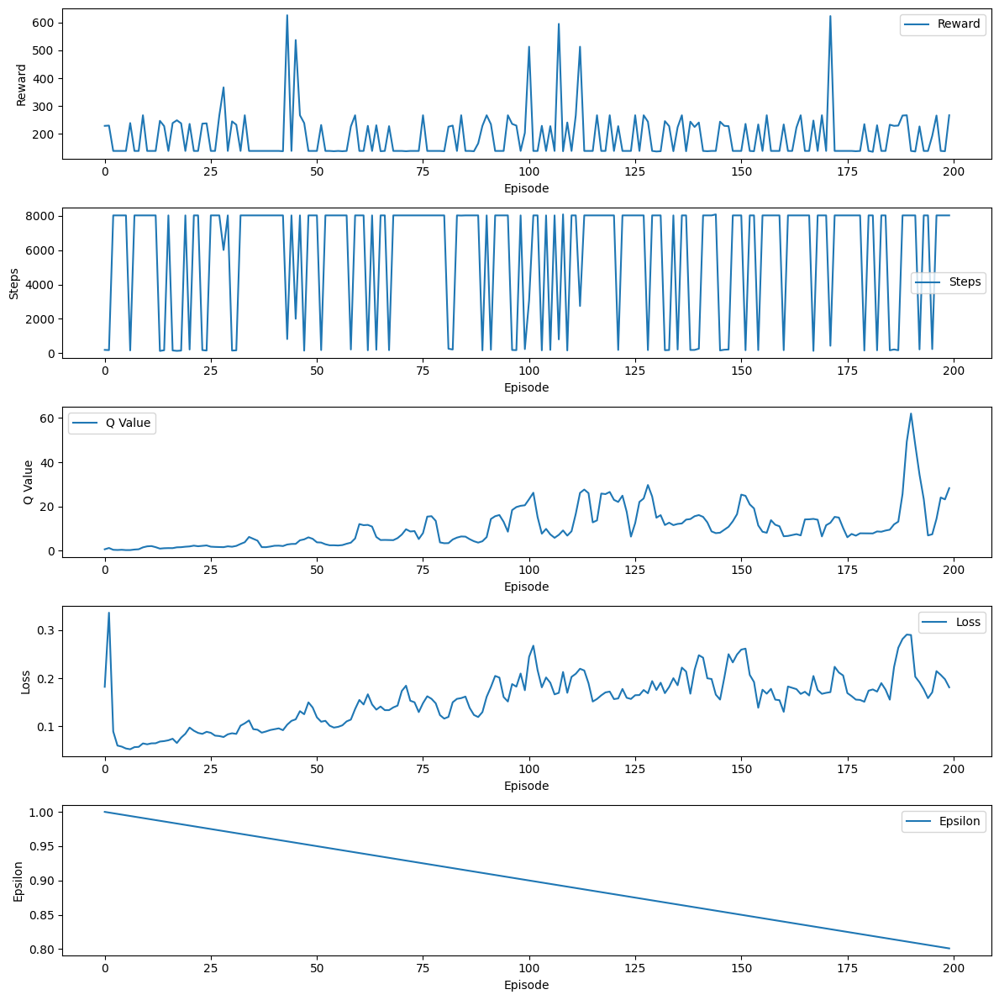

Episode 201 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 138.0, Epsilon: 0.7999999999999998


Episode 202 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 139.0, Epsilon: 0.7989999999999998


Episode 203 abgeschlossen mit 132 Schritten, Gesamtbelohnung: 249.0, Epsilon: 0.7979999999999998


Episode 204 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 139.0, Epsilon: 0.7969999999999998


Episode 205 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 139.0, Epsilon: 0.7959999999999998


Episode 206 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 139.0, Epsilon: 0.7949999999999998


Episode 207 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 139.0, Epsilon: 0.7939999999999998


Episode 208 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.7929999999999998


Episode 209 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.7919999999999998


Episode 210 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 139.0, Epsilon: 0.7909999999999998


E

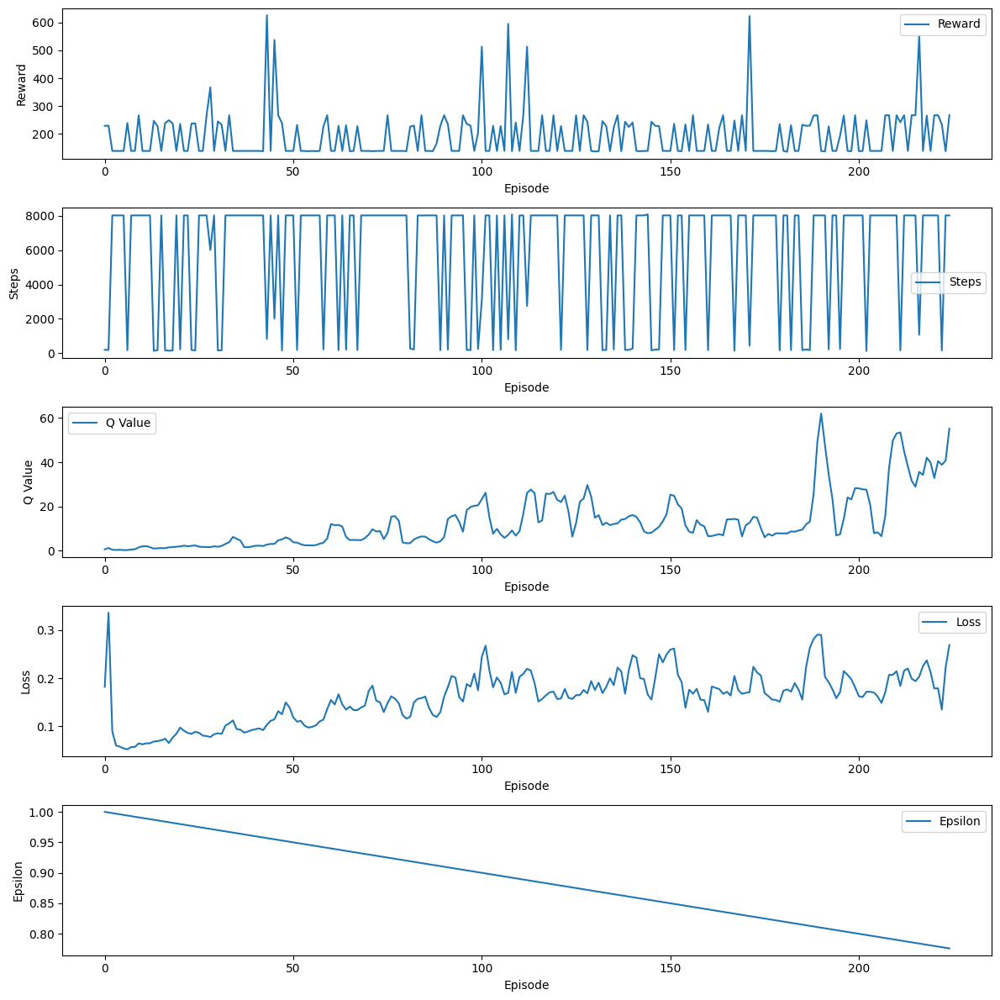

Episode 226 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.7749999999999998


Episode 227 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 139.0, Epsilon: 0.7739999999999998


Episode 228 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 139.0, Epsilon: 0.7729999999999998


Episode 229 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 139.0, Epsilon: 0.7719999999999998


Episode 230 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 138.0, Epsilon: 0.7709999999999998


Episode 231 abgeschlossen mit 7458 Schritten, Gesamtbelohnung: 294.0, Epsilon: 0.7699999999999998


Episode 232 abgeschlossen mit 174 Schritten, Gesamtbelohnung: 232.0, Epsilon: 0.7689999999999998


Episode 233 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 138.0, Epsilon: 0.7679999999999998


Episode 234 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.7669999999999998


Episode 235 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.7659999999999998


E

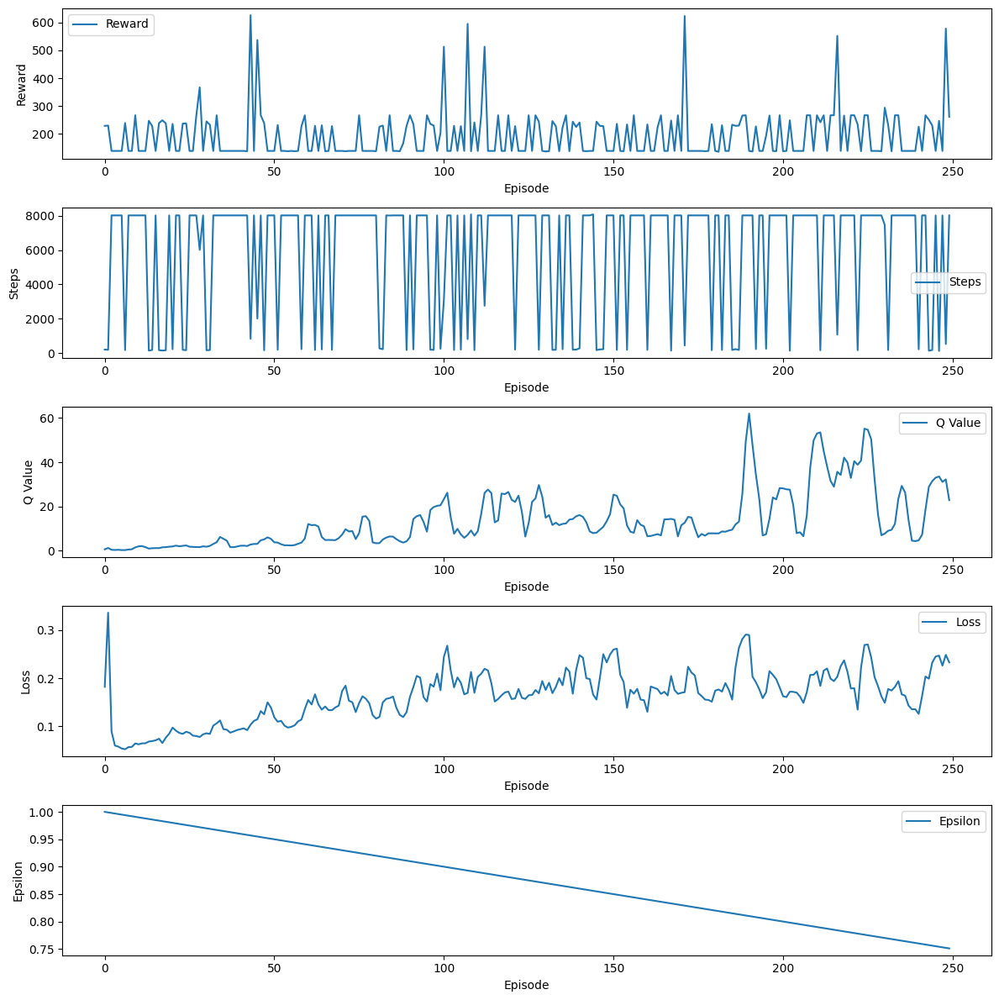

Episode 251 abgeschlossen mit 150 Schritten, Gesamtbelohnung: 242.0, Epsilon: 0.7499999999999998


Episode 252 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 262.0, Epsilon: 0.7489999999999998


Episode 253 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 139.0, Epsilon: 0.7479999999999998


Episode 254 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.7469999999999998


Episode 255 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 139.0, Epsilon: 0.7459999999999998


Episode 256 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.7449999999999998


Episode 257 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 139.0, Epsilon: 0.7439999999999998


Episode 258 abgeschlossen mit 162 Schritten, Gesamtbelohnung: 233.0, Epsilon: 0.7429999999999998


Episode 259 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 139.0, Epsilon: 0.7419999999999998


Episode 260 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 139.0, Epsilon: 0.7409999999999998


Ep

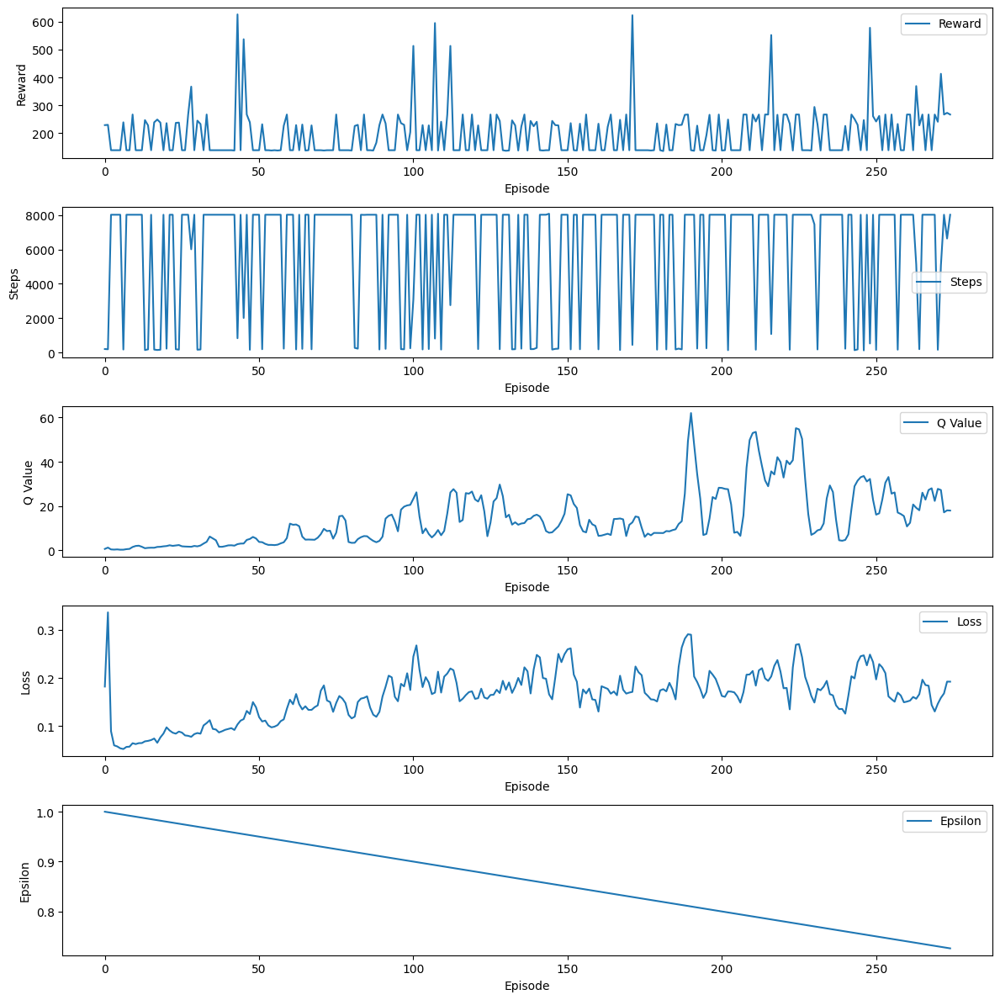

Episode 276 abgeschlossen mit 138 Schritten, Gesamtbelohnung: 241.0, Epsilon: 0.7249999999999998


Episode 277 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 139.0, Epsilon: 0.7239999999999998


Episode 278 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 139.0, Epsilon: 0.7229999999999998


Episode 279 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.7219999999999998


Episode 280 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.7209999999999998


Episode 281 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.7199999999999998


Episode 282 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.7189999999999998


Episode 283 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 139.0, Epsilon: 0.7179999999999997


Episode 284 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.7169999999999997


Episode 285 abgeschlossen mit 7210 Schritten, Gesamtbelohnung: 307.0, Epsilon: 0.7159999999999997


E

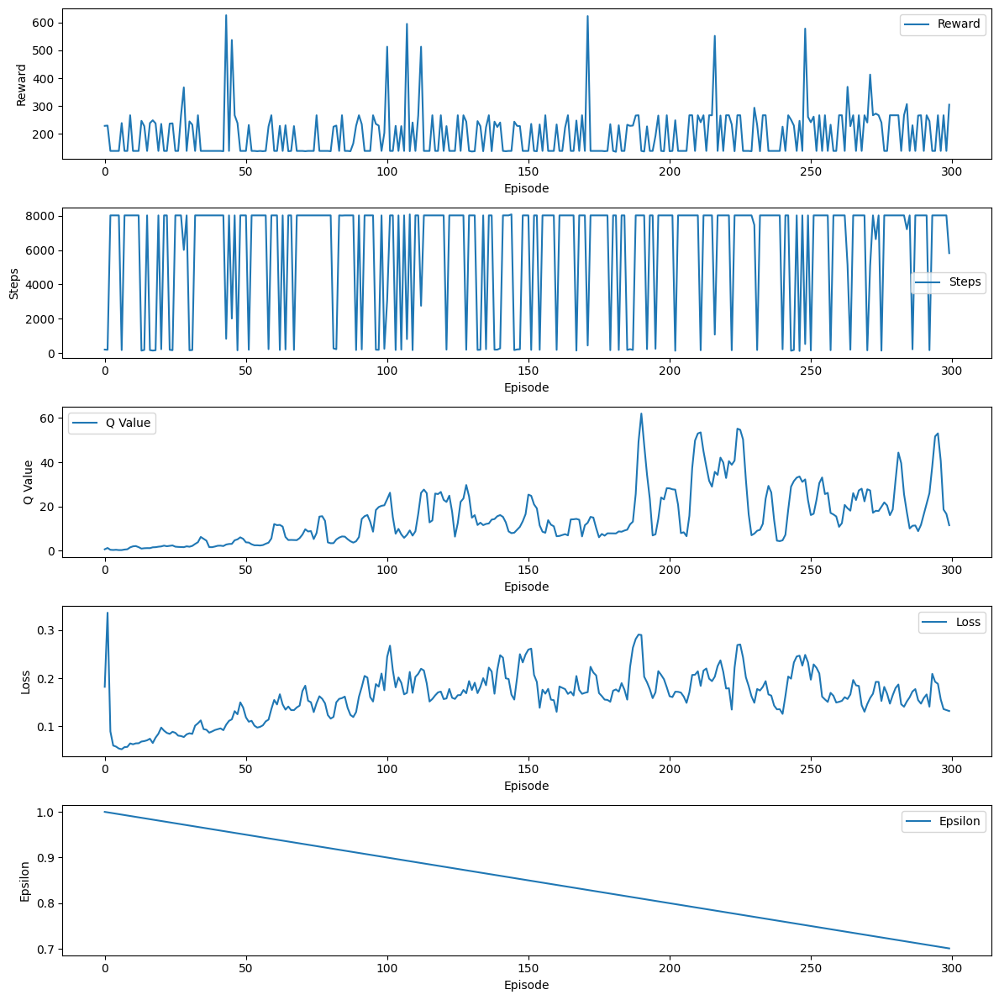

Episode 301 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.6999999999999997


Episode 302 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 139.0, Epsilon: 0.6989999999999997


Episode 303 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 139.0, Epsilon: 0.6979999999999997


Episode 304 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 139.0, Epsilon: 0.6969999999999997


Episode 305 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.6959999999999997


Episode 306 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 139.0, Epsilon: 0.6949999999999997


Episode 307 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.6939999999999997


Episode 308 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.6929999999999997


Episode 309 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.6919999999999997


Episode 310 abgeschlossen mit 688 Schritten, Gesamtbelohnung: 591.0, Epsilon: 0.6909999999999997


E

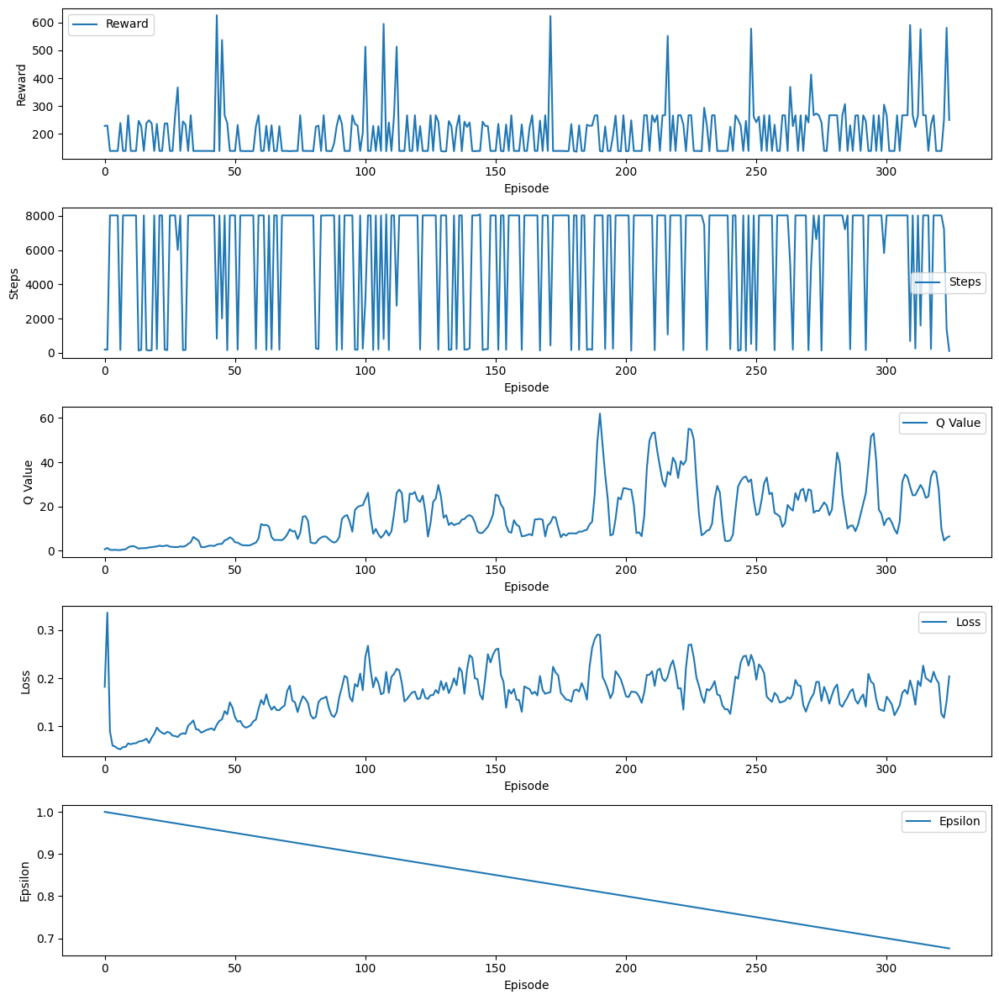

Episode 326 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 139.0, Epsilon: 0.6749999999999997


Episode 327 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.6739999999999997


Episode 328 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.6729999999999997


Episode 329 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.6719999999999997


Episode 330 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.6709999999999997


Episode 331 abgeschlossen mit 3828 Schritten, Gesamtbelohnung: 431.0, Epsilon: 0.6699999999999997


Episode 332 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.6689999999999997


Episode 333 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.6679999999999997


Episode 334 abgeschlossen mit 490 Schritten, Gesamtbelohnung: 208.0, Epsilon: 0.6669999999999997


Episode 335 abgeschlossen mit 190 Schritten, Gesamtbelohnung: 229.0, Epsilon: 0.6659999999999997


Ep

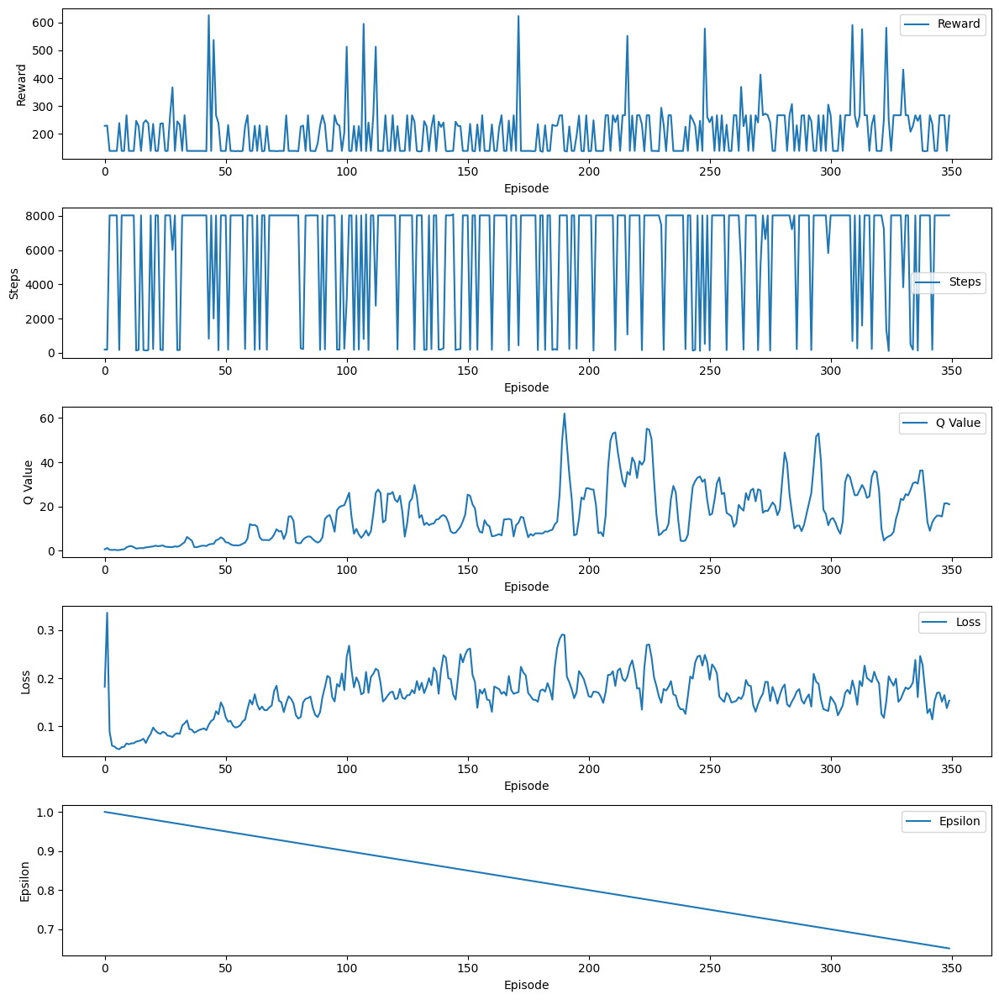

Episode 351 abgeschlossen mit 4836 Schritten, Gesamtbelohnung: 376.0, Epsilon: 0.6499999999999997


Episode 352 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.6489999999999997


Episode 353 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 262.0, Epsilon: 0.6479999999999997


Episode 354 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.6469999999999997


Episode 355 abgeschlossen mit 5174 Schritten, Gesamtbelohnung: 341.0, Epsilon: 0.6459999999999997


Episode 356 abgeschlossen mit 162 Schritten, Gesamtbelohnung: 249.0, Epsilon: 0.6449999999999997


Episode 357 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.6439999999999997


Episode 358 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.6429999999999997


Episode 359 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 266.0, Epsilon: 0.6419999999999997


Episode 360 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 250.0, Epsilon: 0.6409999999999997


E

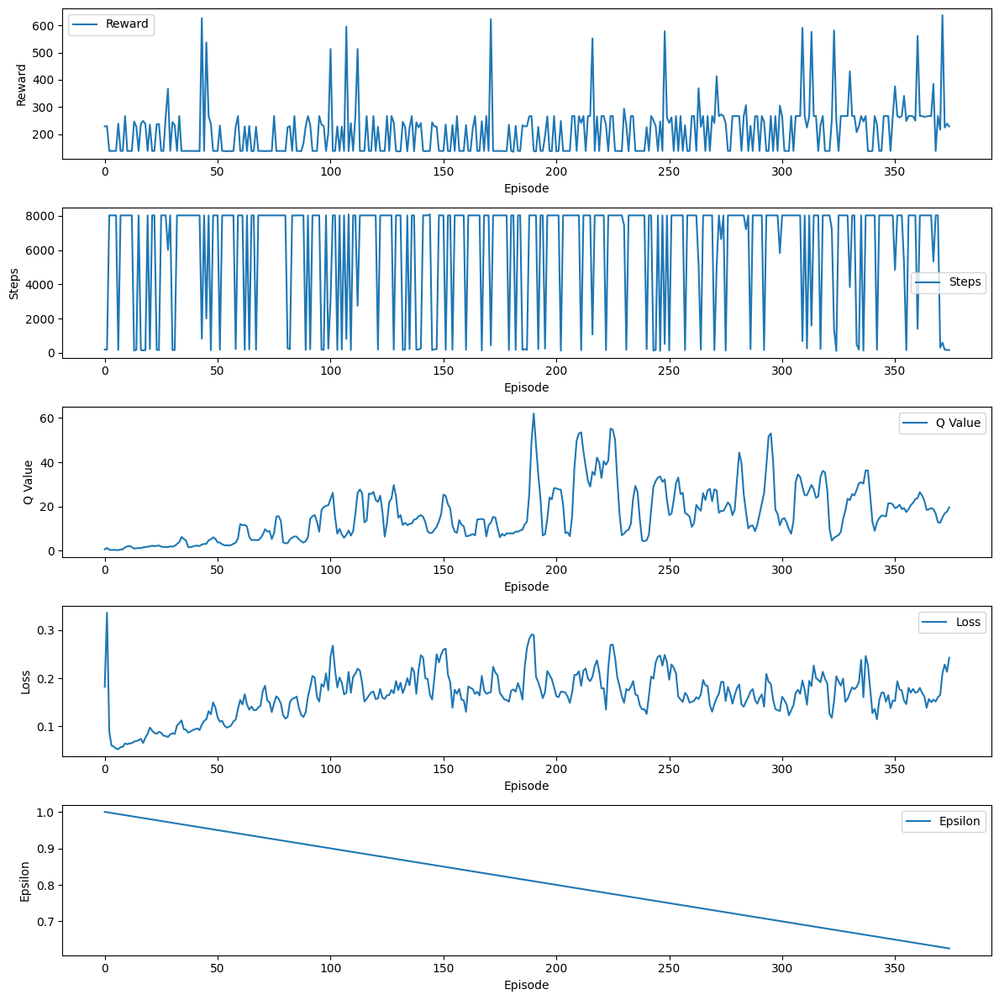

Episode 376 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 139.0, Epsilon: 0.6249999999999997


Episode 377 abgeschlossen mit 3462 Schritten, Gesamtbelohnung: 494.0, Epsilon: 0.6239999999999997


Episode 378 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.6229999999999997


Episode 379 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.6219999999999997


Episode 380 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.6209999999999997


Episode 381 abgeschlossen mit 176 Schritten, Gesamtbelohnung: 228.0, Epsilon: 0.6199999999999997


Episode 382 abgeschlossen mit 170 Schritten, Gesamtbelohnung: 227.0, Epsilon: 0.6189999999999997


Episode 383 abgeschlossen mit 206 Schritten, Gesamtbelohnung: 229.0, Epsilon: 0.6179999999999997


Episode 384 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 139.0, Epsilon: 0.6169999999999997


Episode 385 abgeschlossen mit 160 Schritten, Gesamtbelohnung: 236.0, Epsilon: 0.6159999999999997


Epis

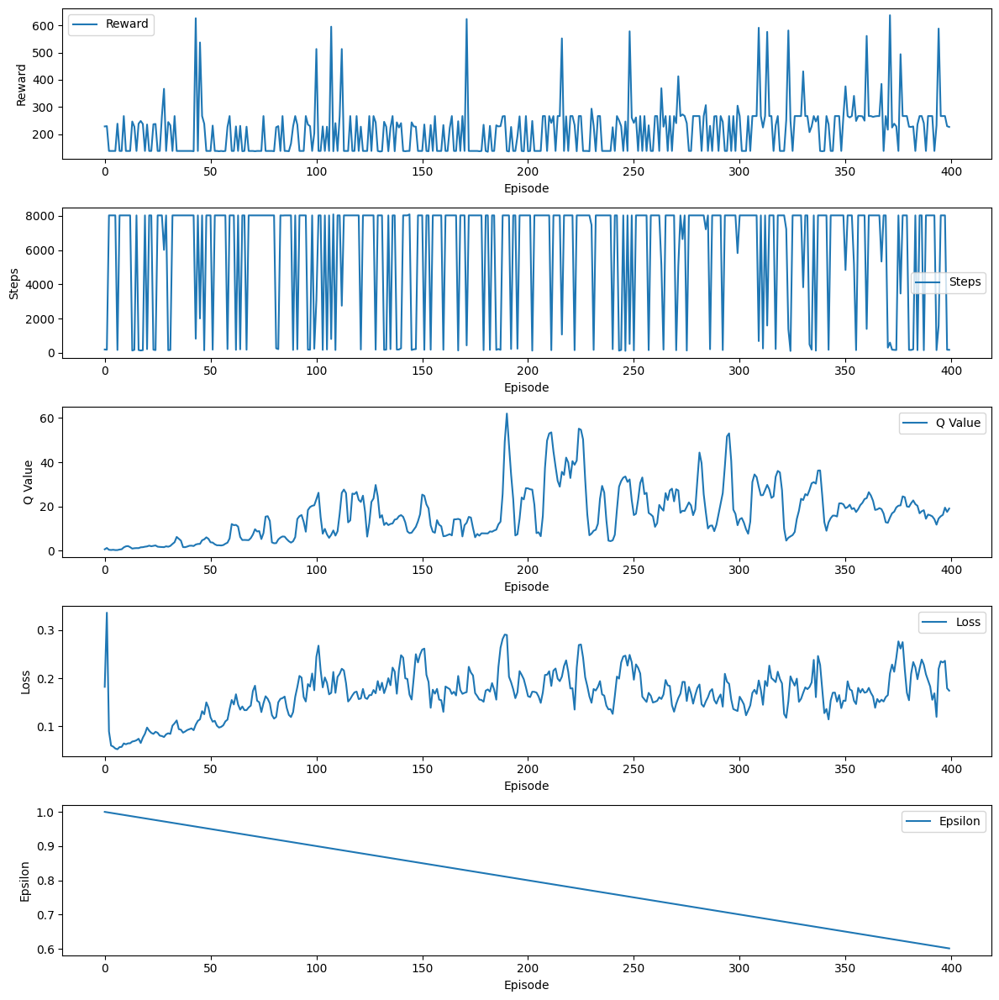

Episode 401 abgeschlossen mit 174 Schritten, Gesamtbelohnung: 244.0, Epsilon: 0.5999999999999996


Episode 402 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 139.0, Epsilon: 0.5989999999999996


Episode 403 abgeschlossen mit 1344 Schritten, Gesamtbelohnung: 578.0, Epsilon: 0.5979999999999996


Episode 404 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.5969999999999996


Episode 405 abgeschlossen mit 356 Schritten, Gesamtbelohnung: 633.0, Epsilon: 0.5959999999999996


Episode 406 abgeschlossen mit 166 Schritten, Gesamtbelohnung: 236.0, Epsilon: 0.5949999999999996


Episode 407 abgeschlossen mit 1718 Schritten, Gesamtbelohnung: 540.0, Epsilon: 0.5939999999999996


Episode 408 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 139.0, Epsilon: 0.5929999999999996


Episode 409 abgeschlossen mit 272 Schritten, Gesamtbelohnung: 221.0, Epsilon: 0.5919999999999996


Episode 410 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.5909999999999996


Epis

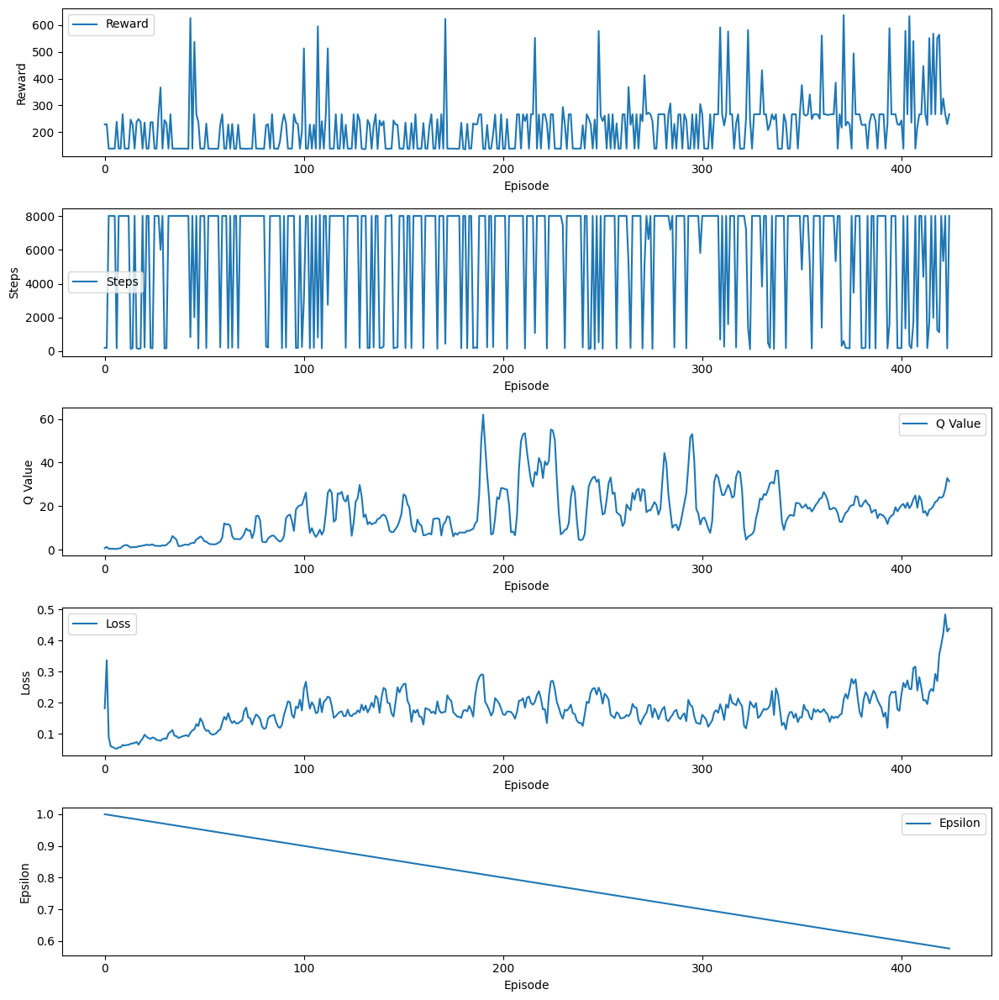

Episode 426 abgeschlossen mit 4362 Schritten, Gesamtbelohnung: 395.0, Epsilon: 0.5749999999999996


Episode 427 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 265.0, Epsilon: 0.5739999999999996


Episode 428 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.5729999999999996


Episode 429 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.5719999999999996


Episode 430 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.5709999999999996


Episode 431 abgeschlossen mit 1500 Schritten, Gesamtbelohnung: 539.0, Epsilon: 0.5699999999999996


Episode 432 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.5689999999999996


Episode 433 abgeschlossen mit 310 Schritten, Gesamtbelohnung: 237.0, Epsilon: 0.5679999999999996


Episode 434 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.5669999999999996


Episode 435 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.5659999999999996


E

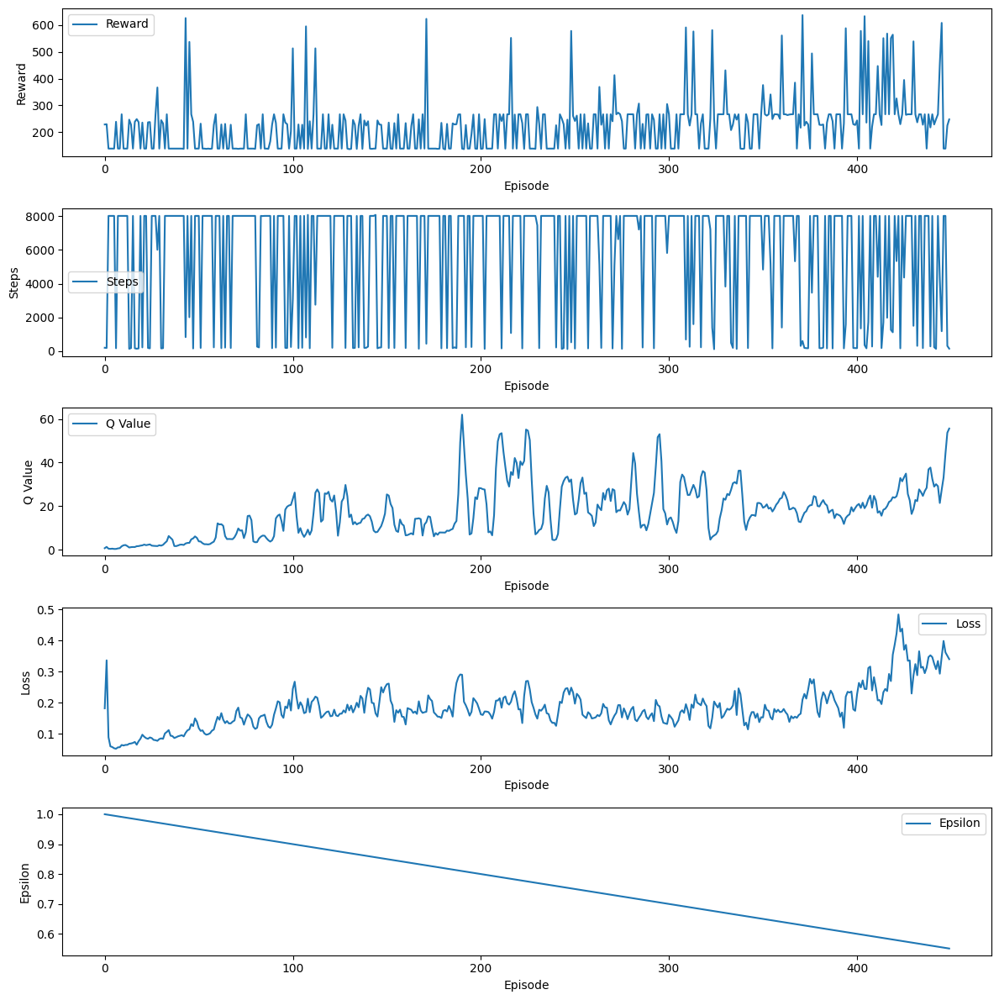

Episode 451 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.5499999999999996


Episode 452 abgeschlossen mit 1172 Schritten, Gesamtbelohnung: 609.0, Epsilon: 0.5489999999999996


Episode 453 abgeschlossen mit 652 Schritten, Gesamtbelohnung: 635.0, Epsilon: 0.5479999999999996


Episode 454 abgeschlossen mit 172 Schritten, Gesamtbelohnung: 227.0, Epsilon: 0.5469999999999996


Episode 455 abgeschlossen mit 186 Schritten, Gesamtbelohnung: 230.0, Epsilon: 0.5459999999999996


Episode 456 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 266.0, Epsilon: 0.5449999999999996


Episode 457 abgeschlossen mit 154 Schritten, Gesamtbelohnung: 242.0, Epsilon: 0.5439999999999996


Episode 458 abgeschlossen mit 172 Schritten, Gesamtbelohnung: 230.0, Epsilon: 0.5429999999999996


Episode 459 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.5419999999999996


Episode 460 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.5409999999999996


Episo

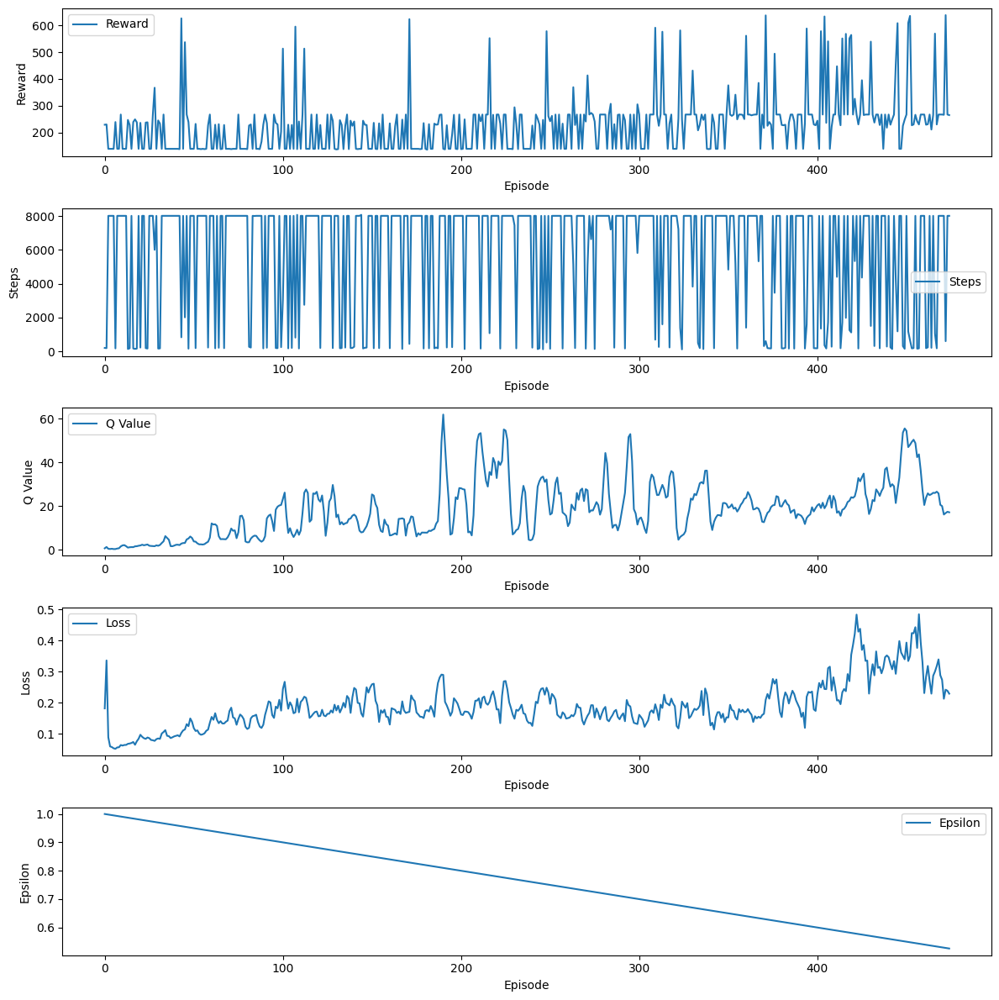

Episode 476 abgeschlossen mit 2386 Schritten, Gesamtbelohnung: 487.0, Epsilon: 0.5249999999999996


Episode 477 abgeschlossen mit 232 Schritten, Gesamtbelohnung: 225.0, Epsilon: 0.5239999999999996


Episode 478 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.5229999999999996


Episode 479 abgeschlossen mit 1232 Schritten, Gesamtbelohnung: 606.0, Epsilon: 0.5219999999999996


Episode 480 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 266.0, Epsilon: 0.5209999999999996


Episode 481 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.5199999999999996


Episode 482 abgeschlossen mit 144 Schritten, Gesamtbelohnung: 246.0, Epsilon: 0.5189999999999996


Episode 483 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 138.0, Epsilon: 0.5179999999999996


Episode 484 abgeschlossen mit 8133 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.5169999999999996


Episode 485 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 139.0, Epsilon: 0.5159999999999996


Ep

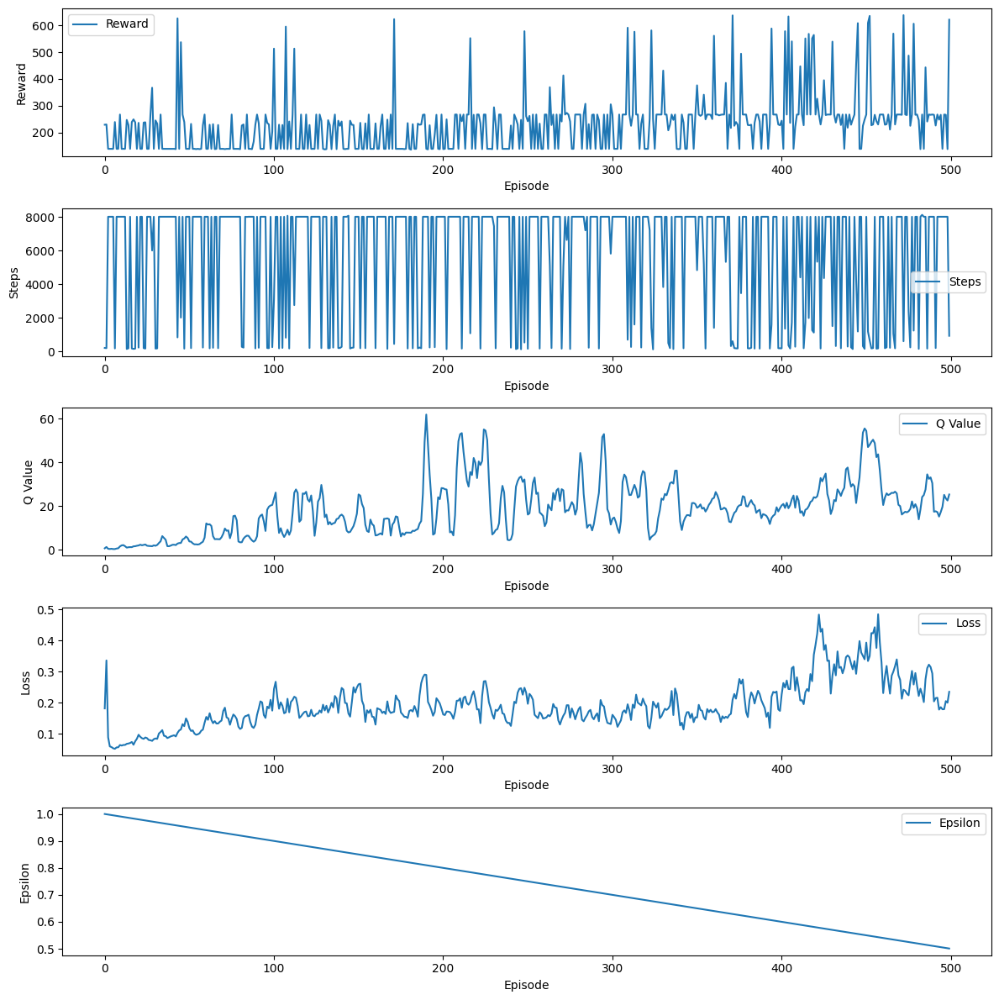

Episode 501 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 266.0, Epsilon: 0.49999999999999956


Episode 502 abgeschlossen mit 178 Schritten, Gesamtbelohnung: 225.0, Epsilon: 0.49899999999999956


Episode 503 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.49799999999999955


Episode 504 abgeschlossen mit 184 Schritten, Gesamtbelohnung: 227.0, Epsilon: 0.49699999999999955


Episode 505 abgeschlossen mit 336 Schritten, Gesamtbelohnung: 223.0, Epsilon: 0.49599999999999955


Episode 506 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.49499999999999955


Episode 507 abgeschlossen mit 126 Schritten, Gesamtbelohnung: 249.0, Epsilon: 0.49399999999999955


Episode 508 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.49299999999999955


Episode 509 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.49199999999999955


Episode 510 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.49099999999999

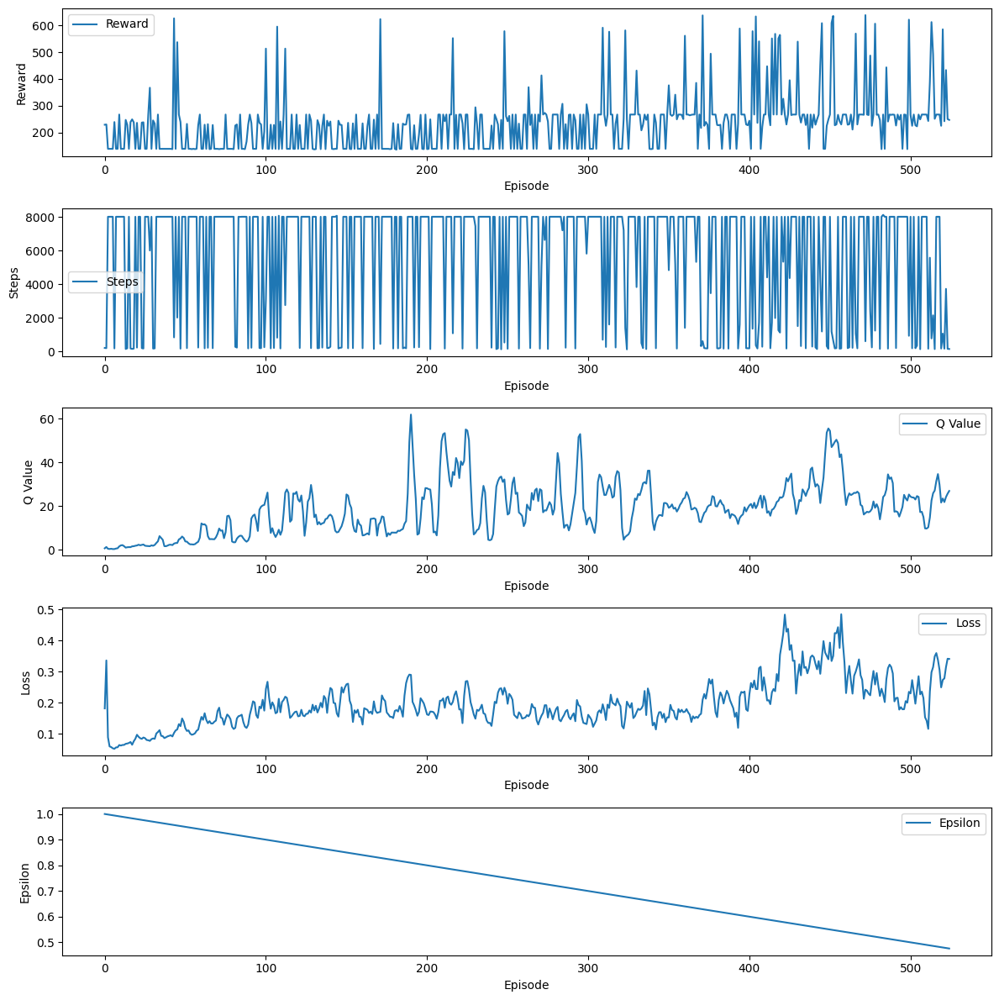

Episode 526 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 139.0, Epsilon: 0.47499999999999953


Episode 527 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.47399999999999953


Episode 528 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.47299999999999953


Episode 529 abgeschlossen mit 192 Schritten, Gesamtbelohnung: 227.0, Epsilon: 0.47199999999999953


Episode 530 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.47099999999999953


Episode 531 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.46999999999999953


Episode 532 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.46899999999999953


Episode 533 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.4679999999999995


Episode 534 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.4669999999999995


Episode 535 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.4659999999999

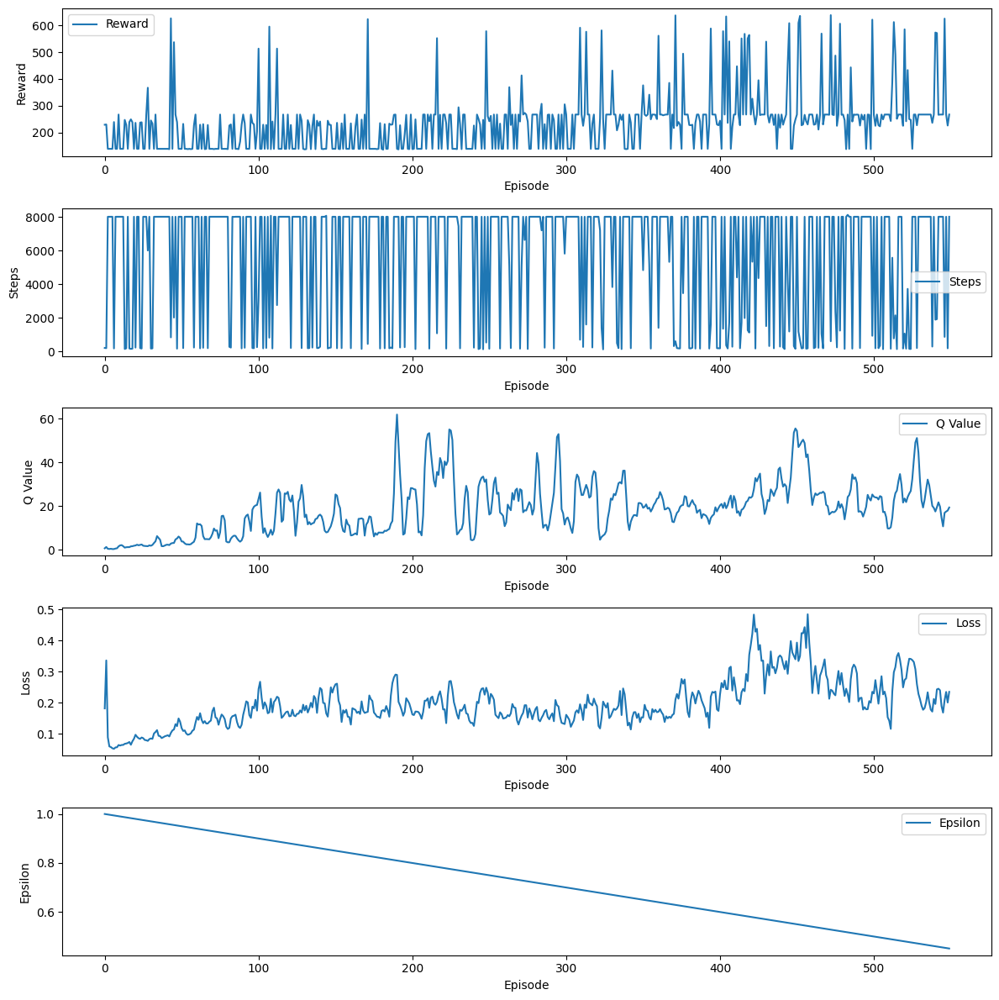

Episode 551 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 139.0, Epsilon: 0.4499999999999995


Episode 552 abgeschlossen mit 424 Schritten, Gesamtbelohnung: 231.0, Epsilon: 0.4489999999999995


Episode 553 abgeschlossen mit 2168 Schritten, Gesamtbelohnung: 508.0, Epsilon: 0.4479999999999995


Episode 554 abgeschlossen mit 274 Schritten, Gesamtbelohnung: 245.0, Epsilon: 0.4469999999999995


Episode 555 abgeschlossen mit 190 Schritten, Gesamtbelohnung: 228.0, Epsilon: 0.4459999999999995


Episode 556 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.4449999999999995


Episode 557 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.4439999999999995


Episode 558 abgeschlossen mit 822 Schritten, Gesamtbelohnung: 626.0, Epsilon: 0.4429999999999995


Episode 559 abgeschlossen mit 2180 Schritten, Gesamtbelohnung: 702.0, Epsilon: 0.4419999999999995


Episode 560 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.4409999999999995


Epis

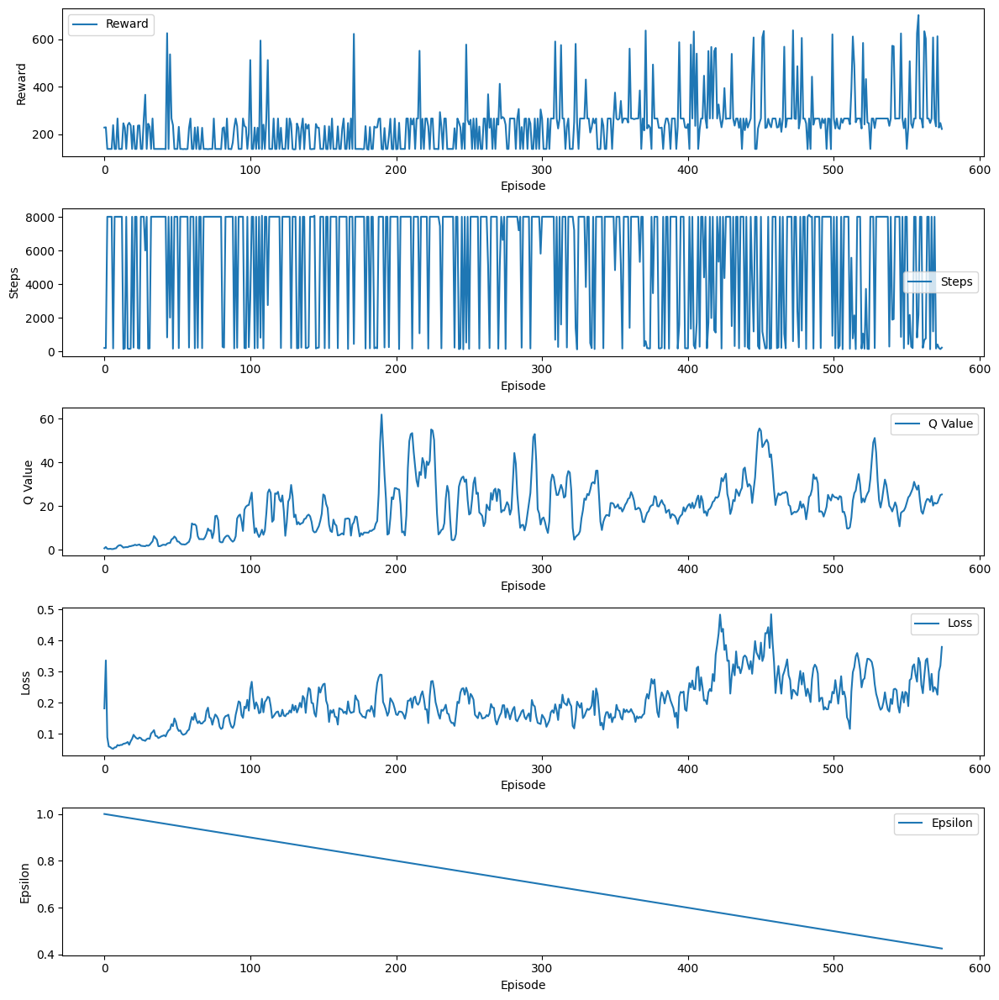

Episode 576 abgeschlossen mit 638 Schritten, Gesamtbelohnung: 636.0, Epsilon: 0.4249999999999995


Episode 577 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.4239999999999995


Episode 578 abgeschlossen mit 164 Schritten, Gesamtbelohnung: 237.0, Epsilon: 0.4229999999999995


Episode 579 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.4219999999999995


Episode 580 abgeschlossen mit 8078 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.4209999999999995


Episode 581 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.4199999999999995


Episode 582 abgeschlossen mit 5494 Schritten, Gesamtbelohnung: 472.0, Epsilon: 0.4189999999999995


Episode 583 abgeschlossen mit 3588 Schritten, Gesamtbelohnung: 460.0, Epsilon: 0.4179999999999995


Episode 584 abgeschlossen mit 2698 Schritten, Gesamtbelohnung: 495.0, Epsilon: 0.4169999999999995


Episode 585 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.4159999999999995


Ep

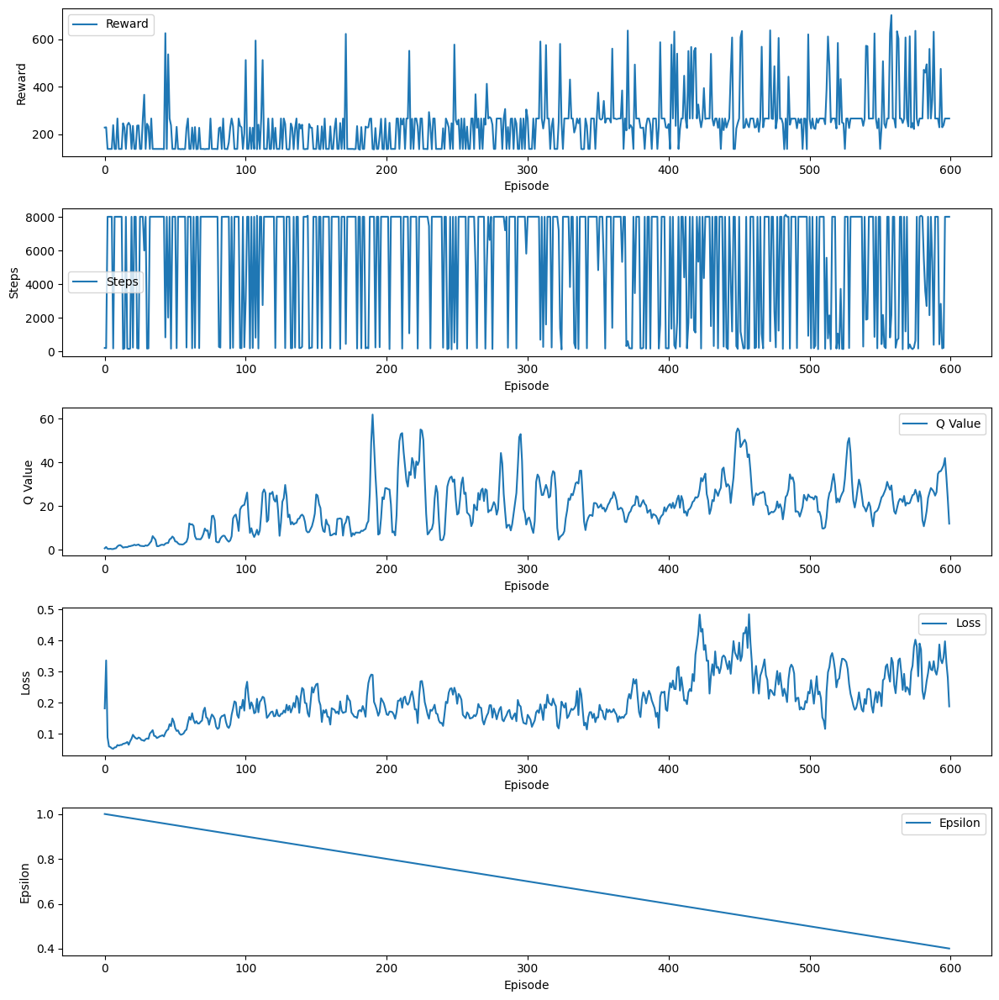

Episode 601 abgeschlossen mit 188 Schritten, Gesamtbelohnung: 243.0, Epsilon: 0.39999999999999947


Episode 602 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.39899999999999947


Episode 603 abgeschlossen mit 194 Schritten, Gesamtbelohnung: 229.0, Epsilon: 0.39799999999999947


Episode 604 abgeschlossen mit 162 Schritten, Gesamtbelohnung: 229.0, Epsilon: 0.39699999999999946


Episode 605 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.39599999999999946


Episode 606 abgeschlossen mit 124 Schritten, Gesamtbelohnung: 247.0, Epsilon: 0.39499999999999946


Episode 607 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.39399999999999946


Episode 608 abgeschlossen mit 136 Schritten, Gesamtbelohnung: 243.0, Epsilon: 0.39299999999999946


Episode 609 abgeschlossen mit 260 Schritten, Gesamtbelohnung: 215.0, Epsilon: 0.39199999999999946


Episode 610 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.3909999999999994

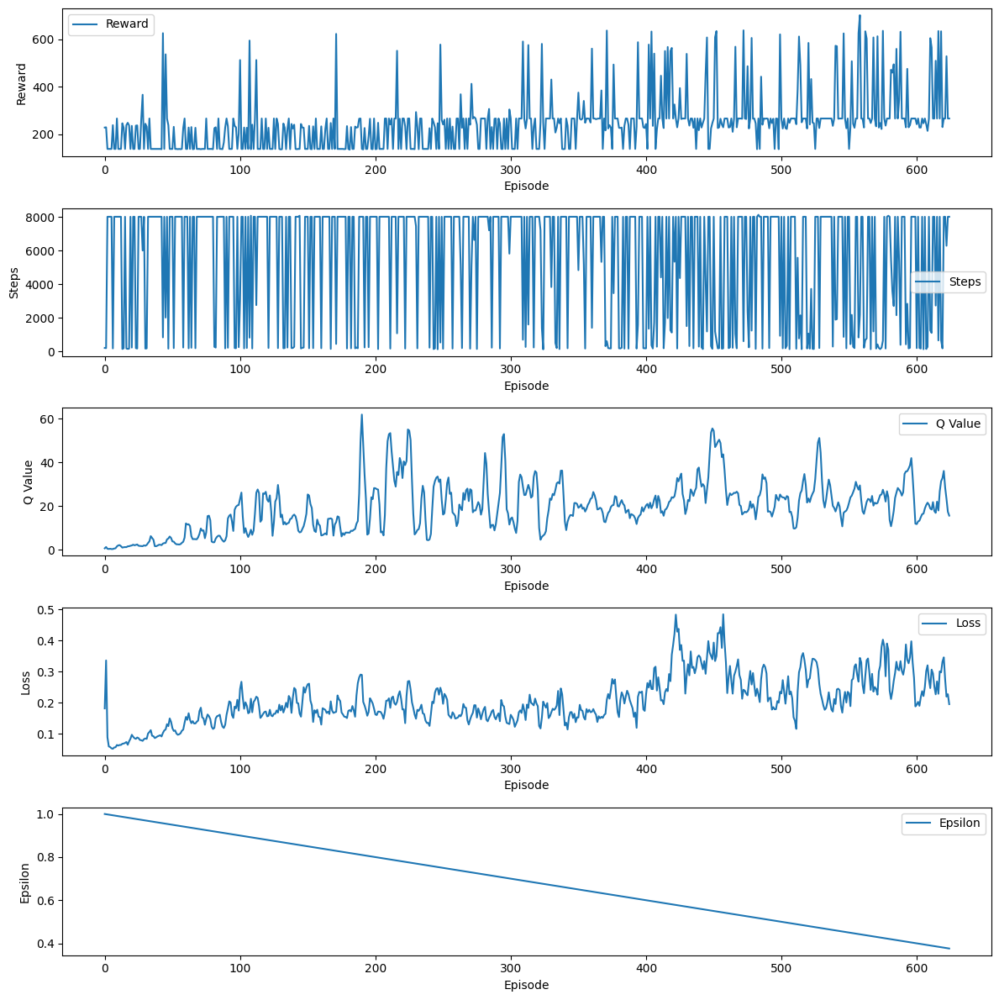

Episode 626 abgeschlossen mit 8078 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.37499999999999944


Episode 627 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 443.0, Epsilon: 0.37399999999999944


Episode 628 abgeschlossen mit 206 Schritten, Gesamtbelohnung: 216.0, Epsilon: 0.37299999999999944


Episode 629 abgeschlossen mit 158 Schritten, Gesamtbelohnung: 237.0, Epsilon: 0.37199999999999944


Episode 630 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.37099999999999944


Episode 631 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.36999999999999944


Episode 632 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.36899999999999944


Episode 633 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.36799999999999944


Episode 634 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.36699999999999944


Episode 635 abgeschlossen mit 170 Schritten, Gesamtbelohnung: 232.0, Epsilon: 0.3659999999999

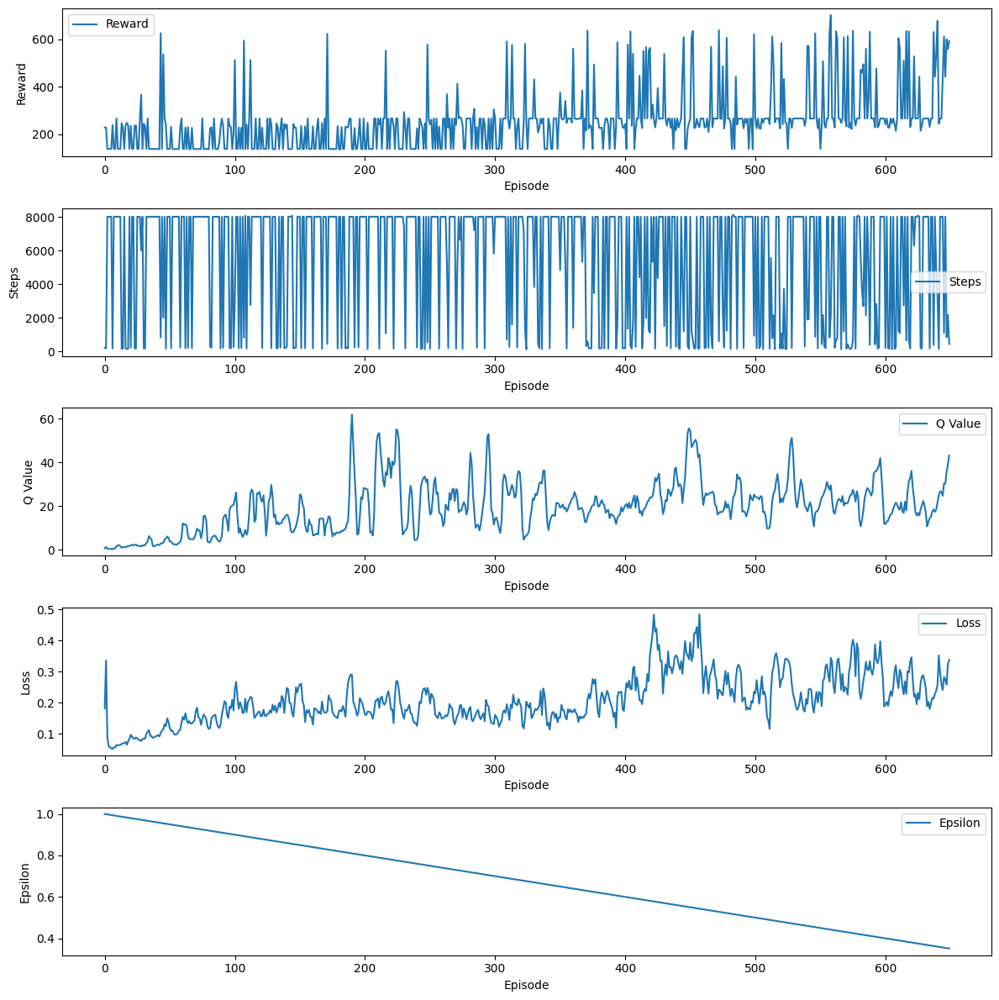

Episode 651 abgeschlossen mit 144 Schritten, Gesamtbelohnung: 243.0, Epsilon: 0.3499999999999994


Episode 652 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.3489999999999994


Episode 653 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.3479999999999994


Episode 654 abgeschlossen mit 136 Schritten, Gesamtbelohnung: 244.0, Epsilon: 0.3469999999999994


Episode 655 abgeschlossen mit 2224 Schritten, Gesamtbelohnung: 539.0, Epsilon: 0.3459999999999994


Episode 656 abgeschlossen mit 2540 Schritten, Gesamtbelohnung: 654.0, Epsilon: 0.3449999999999994


Episode 657 abgeschlossen mit 164 Schritten, Gesamtbelohnung: 230.0, Epsilon: 0.3439999999999994


Episode 658 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.3429999999999994


Episode 659 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.3419999999999994


Episode 660 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.3409999999999994


Epi

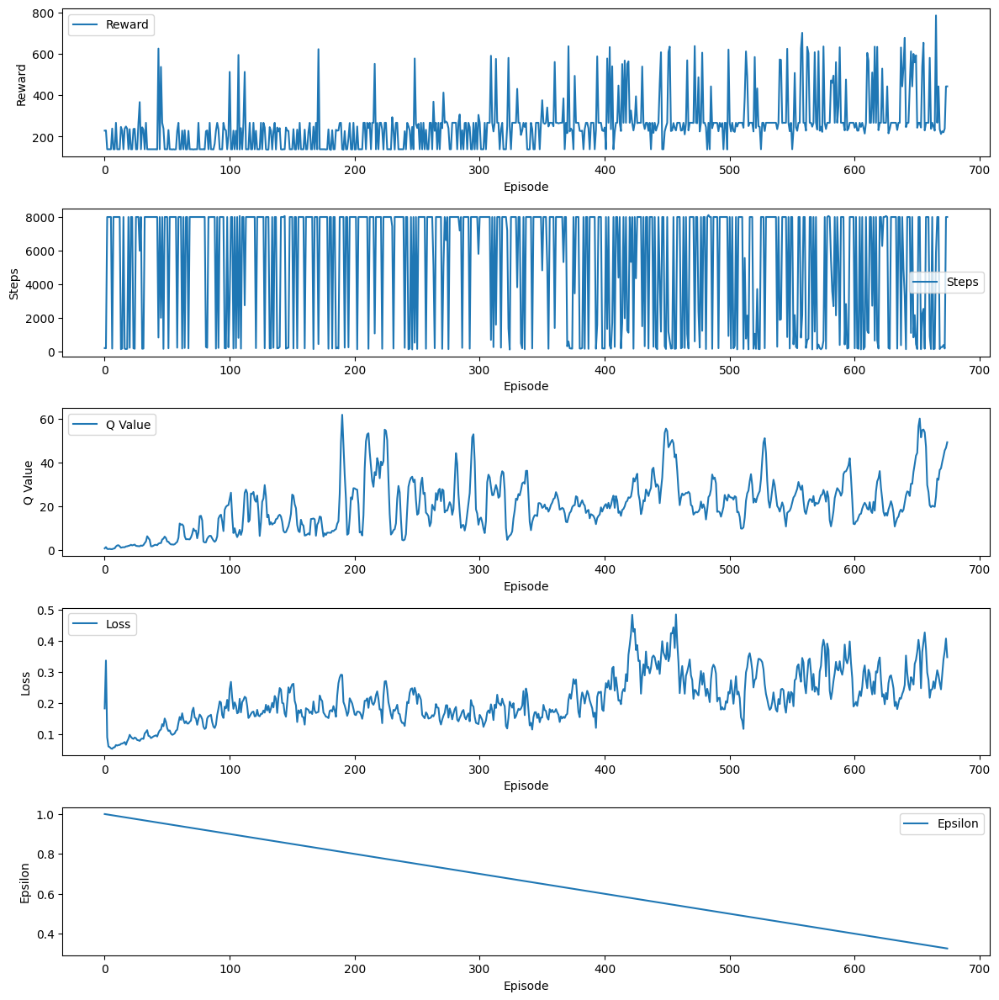

Episode 676 abgeschlossen mit 802 Schritten, Gesamtbelohnung: 625.0, Epsilon: 0.3249999999999994


Episode 677 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 249.0, Epsilon: 0.3239999999999994


Episode 678 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.3229999999999994


Episode 679 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.3219999999999994


Episode 680 abgeschlossen mit 7748 Schritten, Gesamtbelohnung: 456.0, Epsilon: 0.3209999999999994


Episode 681 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.3199999999999994


Episode 682 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.3189999999999994


Episode 683 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.3179999999999994


Episode 684 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 261.0, Epsilon: 0.3169999999999994


Episode 685 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.3159999999999994


E

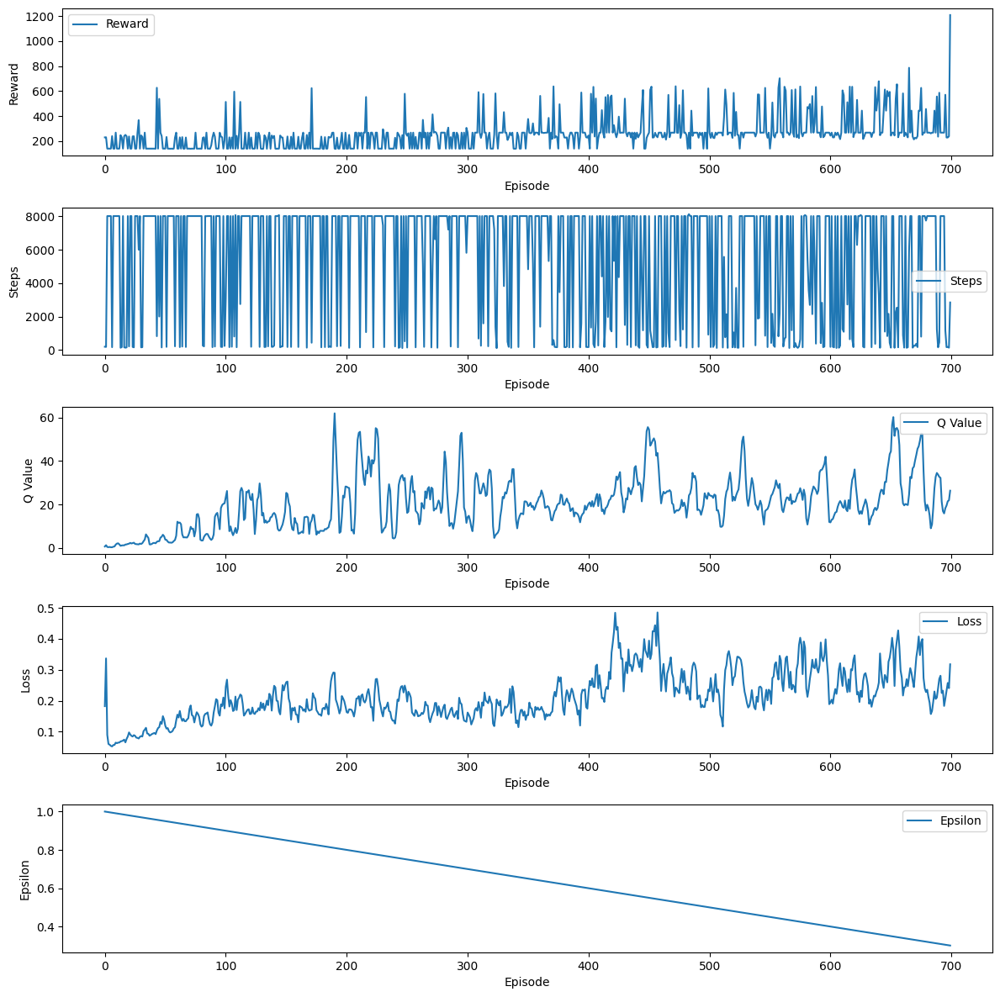

Episode 701 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.2999999999999994


Episode 702 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.2989999999999994


Episode 703 abgeschlossen mit 630 Schritten, Gesamtbelohnung: 636.0, Epsilon: 0.2979999999999994


Episode 704 abgeschlossen mit 146 Schritten, Gesamtbelohnung: 248.0, Epsilon: 0.2969999999999994


Episode 705 abgeschlossen mit 194 Schritten, Gesamtbelohnung: 225.0, Epsilon: 0.2959999999999994


Episode 706 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.2949999999999994


Episode 707 abgeschlossen mit 1634 Schritten, Gesamtbelohnung: 563.0, Epsilon: 0.2939999999999994


Episode 708 abgeschlossen mit 216 Schritten, Gesamtbelohnung: 213.0, Epsilon: 0.29299999999999937


Episode 709 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.29199999999999937


Episode 710 abgeschlossen mit 170 Schritten, Gesamtbelohnung: 238.0, Epsilon: 0.29099999999999937


Ep

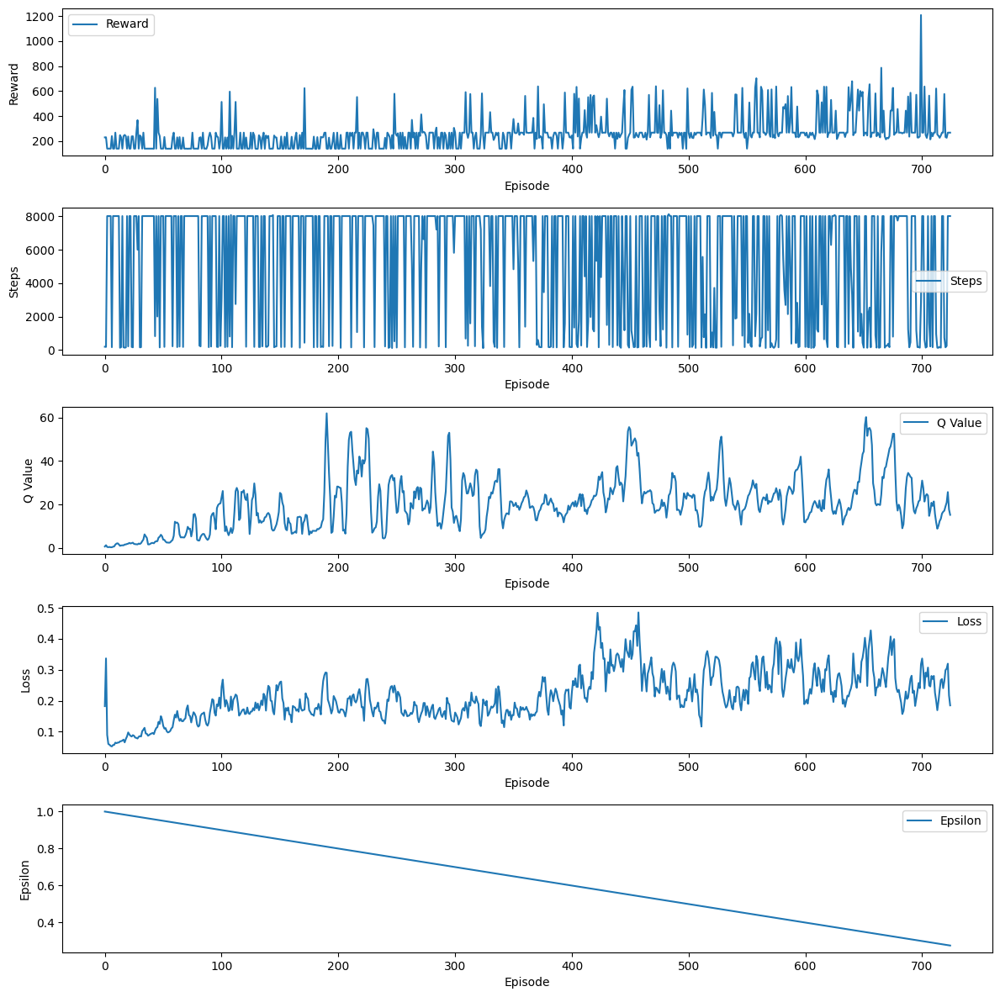

Episode 726 abgeschlossen mit 1942 Schritten, Gesamtbelohnung: 509.0, Epsilon: 0.27499999999999936


Episode 727 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.27399999999999936


Episode 728 abgeschlossen mit 7782 Schritten, Gesamtbelohnung: 969.0, Epsilon: 0.27299999999999935


Episode 729 abgeschlossen mit 8133 Schritten, Gesamtbelohnung: 588.0, Epsilon: 0.27199999999999935


Episode 730 abgeschlossen mit 2848 Schritten, Gesamtbelohnung: 666.0, Epsilon: 0.27099999999999935


Episode 731 abgeschlossen mit 3214 Schritten, Gesamtbelohnung: 475.0, Epsilon: 0.26999999999999935


Episode 732 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 443.0, Epsilon: 0.26899999999999935


Episode 733 abgeschlossen mit 450 Schritten, Gesamtbelohnung: 580.0, Epsilon: 0.26799999999999935


Episode 734 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.26699999999999935


Episode 735 abgeschlossen mit 3815 Schritten, Gesamtbelohnung: 881.0, Epsilon: 0.26599999999

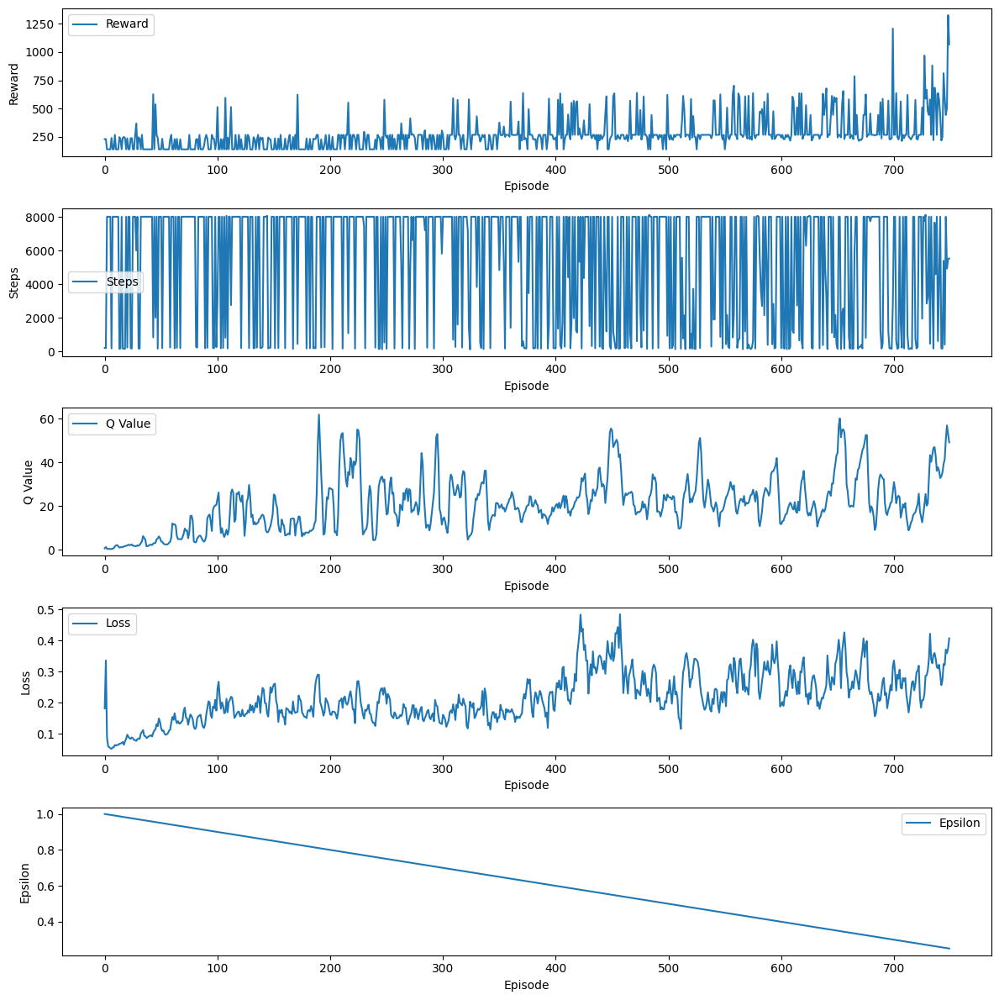

Episode 751 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.24999999999999933


Episode 752 abgeschlossen mit 4498 Schritten, Gesamtbelohnung: 837.0, Epsilon: 0.24899999999999933


Episode 753 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.24799999999999933


Episode 754 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 443.0, Epsilon: 0.24699999999999933


Episode 755 abgeschlossen mit 598 Schritten, Gesamtbelohnung: 638.0, Epsilon: 0.24599999999999933


Episode 756 abgeschlossen mit 2798 Schritten, Gesamtbelohnung: 704.0, Epsilon: 0.24499999999999933


Episode 757 abgeschlossen mit 3282 Schritten, Gesamtbelohnung: 907.0, Epsilon: 0.24399999999999933


Episode 758 abgeschlossen mit 5101 Schritten, Gesamtbelohnung: 1089.0, Epsilon: 0.24299999999999933


Episode 759 abgeschlossen mit 800 Schritten, Gesamtbelohnung: 569.0, Epsilon: 0.24199999999999933


Episode 760 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.24099999999

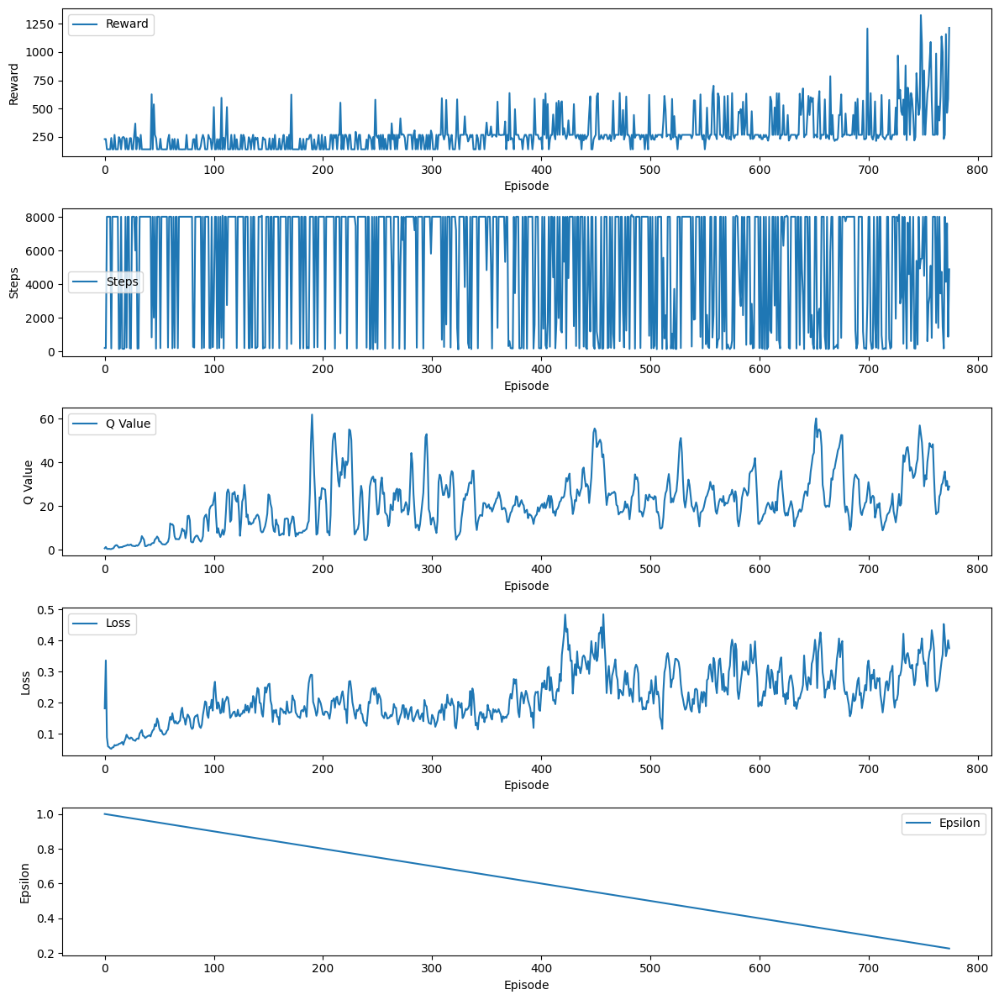

Episode 776 abgeschlossen mit 2496 Schritten, Gesamtbelohnung: 719.0, Epsilon: 0.2249999999999993


Episode 777 abgeschlossen mit 218 Schritten, Gesamtbelohnung: 217.0, Epsilon: 0.2239999999999993


Episode 778 abgeschlossen mit 172 Schritten, Gesamtbelohnung: 230.0, Epsilon: 0.2229999999999993


Episode 779 abgeschlossen mit 5048 Schritten, Gesamtbelohnung: 539.0, Epsilon: 0.2219999999999993


Episode 780 abgeschlossen mit 738 Schritten, Gesamtbelohnung: 588.0, Epsilon: 0.2209999999999993


Episode 781 abgeschlossen mit 154 Schritten, Gesamtbelohnung: 245.0, Epsilon: 0.2199999999999993


Episode 782 abgeschlossen mit 148 Schritten, Gesamtbelohnung: 231.0, Epsilon: 0.2189999999999993


Episode 783 abgeschlossen mit 3280 Schritten, Gesamtbelohnung: 620.0, Epsilon: 0.2179999999999993


Episode 784 abgeschlossen mit 198 Schritten, Gesamtbelohnung: 215.0, Epsilon: 0.2169999999999993


Episode 785 abgeschlossen mit 152 Schritten, Gesamtbelohnung: 238.0, Epsilon: 0.2159999999999993


Episode

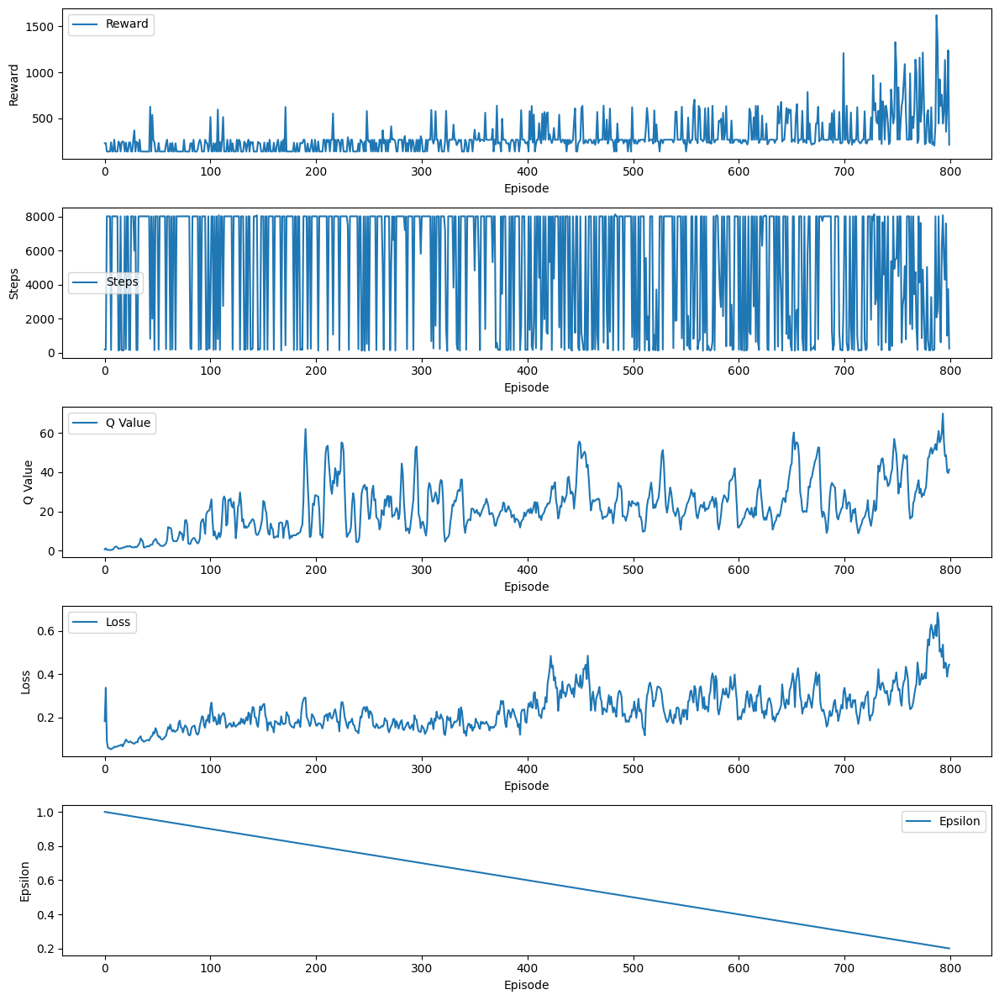

Episode 801 abgeschlossen mit 3993 Schritten, Gesamtbelohnung: 1170.0, Epsilon: 0.1999999999999993


Episode 802 abgeschlossen mit 134 Schritten, Gesamtbelohnung: 235.0, Epsilon: 0.1989999999999993


Episode 803 abgeschlossen mit 122 Schritten, Gesamtbelohnung: 249.0, Epsilon: 0.1979999999999993


Episode 804 abgeschlossen mit 5368 Schritten, Gesamtbelohnung: 1102.0, Epsilon: 0.1969999999999993


Episode 805 abgeschlossen mit 3446 Schritten, Gesamtbelohnung: 596.0, Epsilon: 0.19599999999999929


Episode 806 abgeschlossen mit 1596 Schritten, Gesamtbelohnung: 764.0, Epsilon: 0.19499999999999929


Episode 807 abgeschlossen mit 8133 Schritten, Gesamtbelohnung: 857.0, Epsilon: 0.19399999999999928


Episode 808 abgeschlossen mit 118 Schritten, Gesamtbelohnung: 251.0, Epsilon: 0.19299999999999928


Episode 809 abgeschlossen mit 450 Schritten, Gesamtbelohnung: 580.0, Epsilon: 0.19199999999999928


Episode 810 abgeschlossen mit 2109 Schritten, Gesamtbelohnung: 966.0, Epsilon: 0.1909999999999992

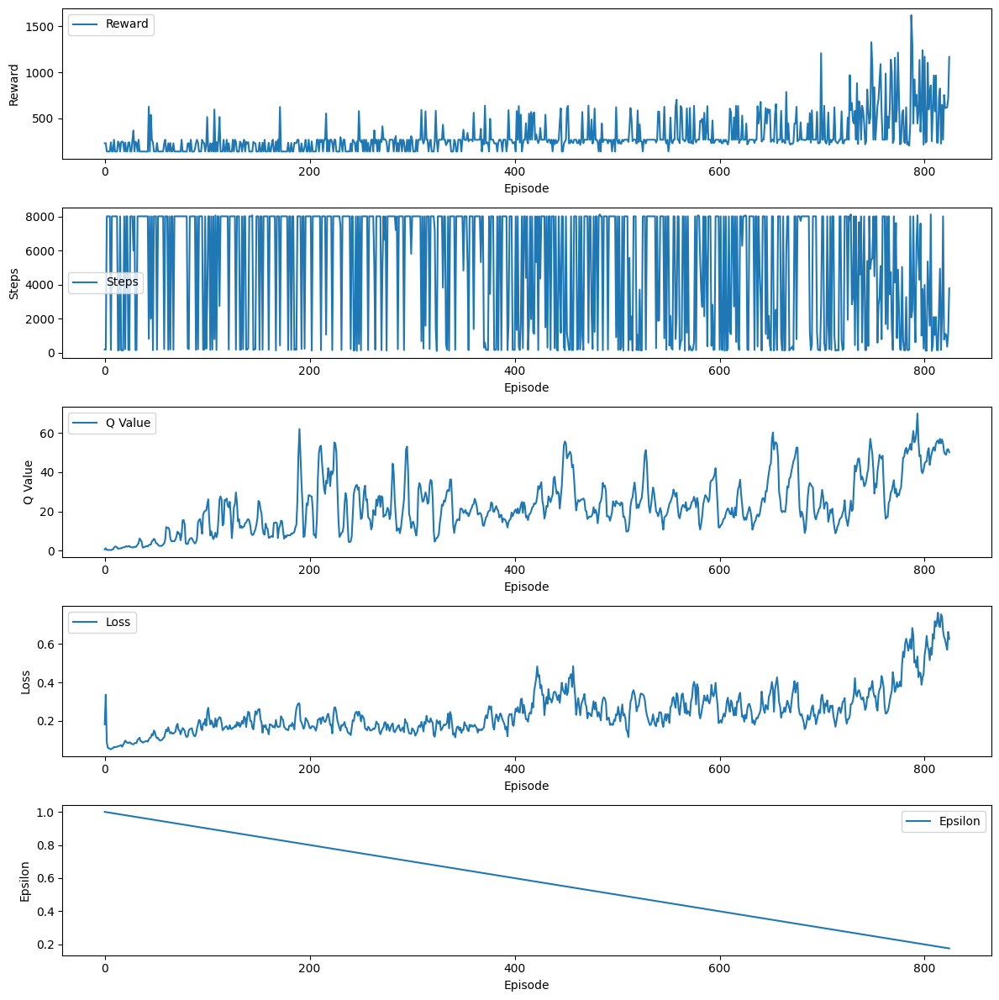

Episode 826 abgeschlossen mit 146 Schritten, Gesamtbelohnung: 236.0, Epsilon: 0.17499999999999927


Episode 827 abgeschlossen mit 2252 Schritten, Gesamtbelohnung: 614.0, Epsilon: 0.17399999999999927


Episode 828 abgeschlossen mit 1492 Schritten, Gesamtbelohnung: 718.0, Epsilon: 0.17299999999999927


Episode 829 abgeschlossen mit 144 Schritten, Gesamtbelohnung: 239.0, Epsilon: 0.17199999999999926


Episode 830 abgeschlossen mit 2064 Schritten, Gesamtbelohnung: 1265.0, Epsilon: 0.17099999999999926


Episode 831 abgeschlossen mit 1178 Schritten, Gesamtbelohnung: 785.0, Epsilon: 0.16999999999999926


Episode 832 abgeschlossen mit 3075 Schritten, Gesamtbelohnung: 920.0, Epsilon: 0.16899999999999926


Episode 833 abgeschlossen mit 148 Schritten, Gesamtbelohnung: 246.0, Epsilon: 0.16799999999999926


Episode 834 abgeschlossen mit 212 Schritten, Gesamtbelohnung: 246.0, Epsilon: 0.16699999999999926


Episode 835 abgeschlossen mit 534 Schritten, Gesamtbelohnung: 604.0, Epsilon: 0.16599999999999

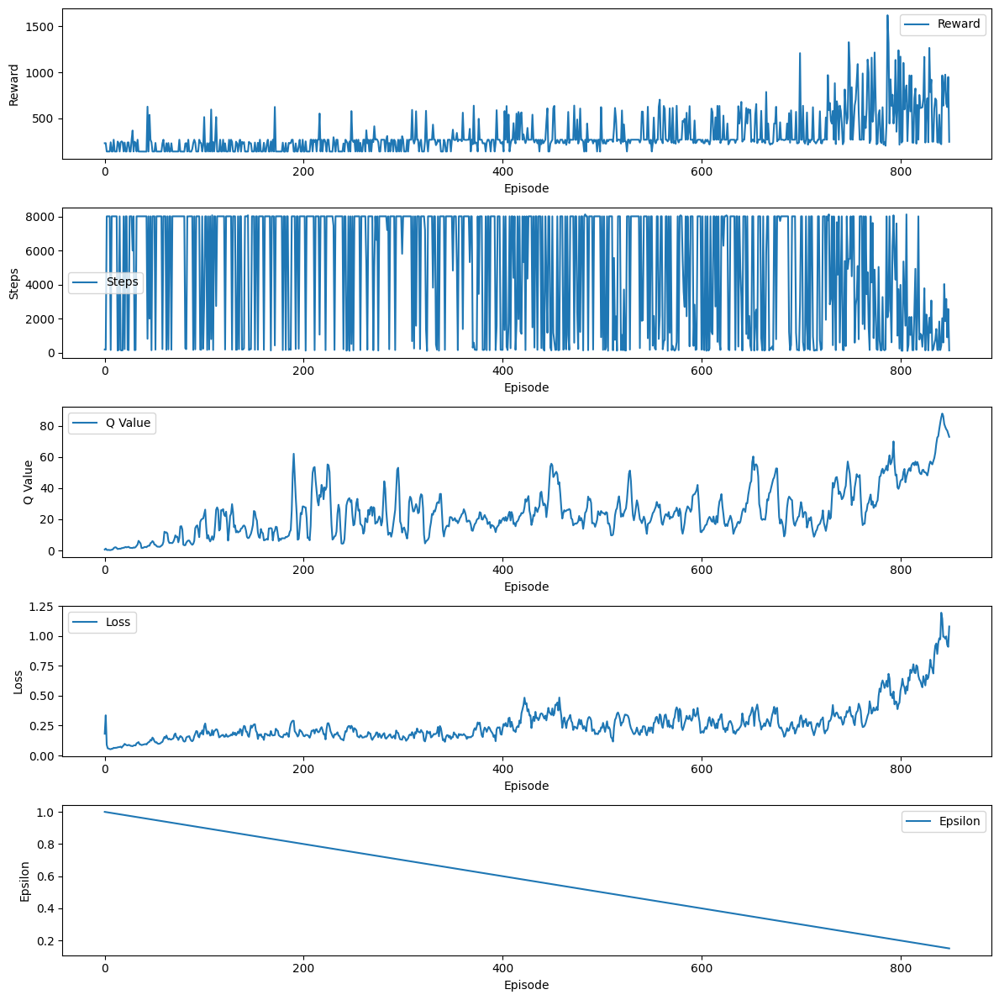

Episode 851 abgeschlossen mit 602 Schritten, Gesamtbelohnung: 761.0, Epsilon: 0.14999999999999925


Episode 852 abgeschlossen mit 764 Schritten, Gesamtbelohnung: 574.0, Epsilon: 0.14899999999999924


Episode 853 abgeschlossen mit 372 Schritten, Gesamtbelohnung: 604.0, Epsilon: 0.14799999999999924


Episode 854 abgeschlossen mit 834 Schritten, Gesamtbelohnung: 574.0, Epsilon: 0.14699999999999924


Episode 855 abgeschlossen mit 1598 Schritten, Gesamtbelohnung: 728.0, Epsilon: 0.14599999999999924


Episode 856 abgeschlossen mit 162 Schritten, Gesamtbelohnung: 244.0, Epsilon: 0.14499999999999924


Episode 857 abgeschlossen mit 950 Schritten, Gesamtbelohnung: 789.0, Epsilon: 0.14399999999999924


Episode 858 abgeschlossen mit 168 Schritten, Gesamtbelohnung: 238.0, Epsilon: 0.14299999999999924


Episode 859 abgeschlossen mit 3788 Schritten, Gesamtbelohnung: 881.0, Epsilon: 0.14199999999999924


Episode 860 abgeschlossen mit 166 Schritten, Gesamtbelohnung: 228.0, Epsilon: 0.14099999999999924


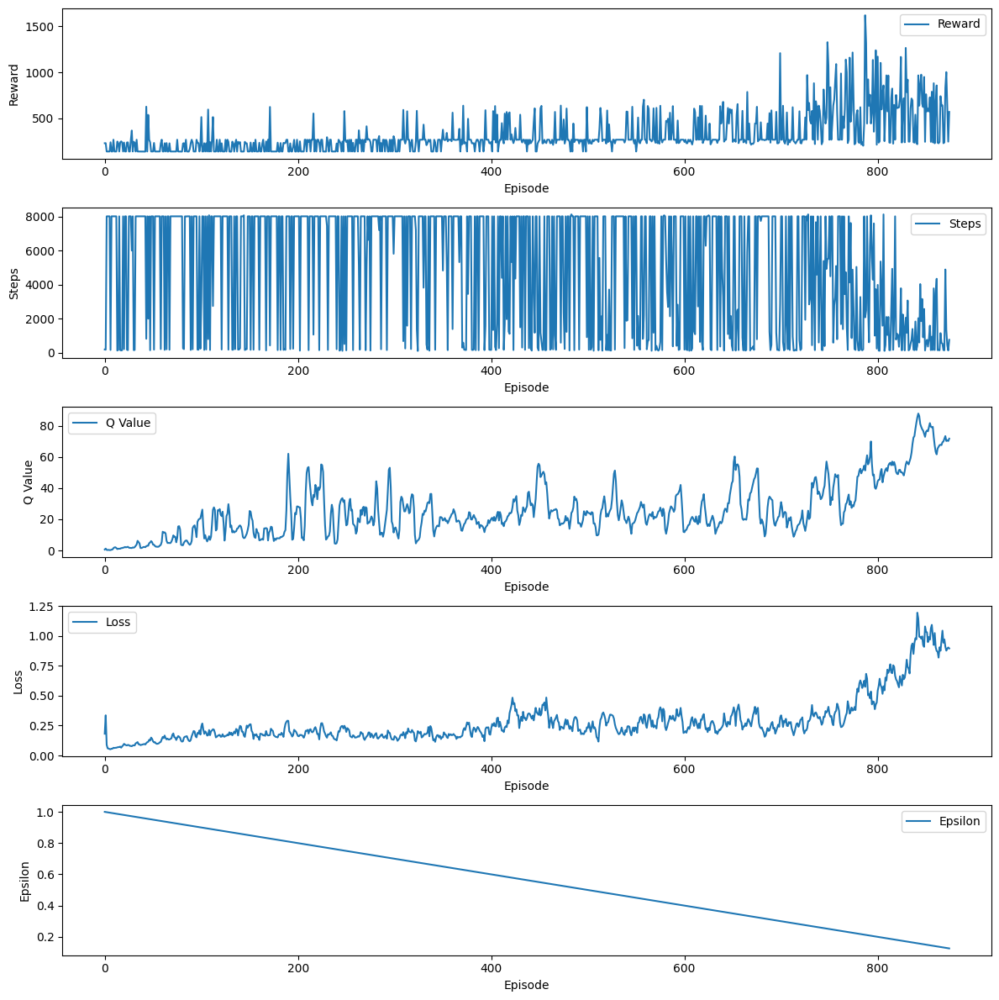

Episode 876 abgeschlossen mit 2568 Schritten, Gesamtbelohnung: 655.0, Epsilon: 0.12499999999999922


Episode 877 abgeschlossen mit 122 Schritten, Gesamtbelohnung: 243.0, Epsilon: 0.12399999999999922


Episode 878 abgeschlossen mit 1616 Schritten, Gesamtbelohnung: 696.0, Epsilon: 0.12299999999999922


Episode 879 abgeschlossen mit 174 Schritten, Gesamtbelohnung: 239.0, Epsilon: 0.12199999999999922


Episode 880 abgeschlossen mit 1198 Schritten, Gesamtbelohnung: 593.0, Epsilon: 0.12099999999999922


Episode 881 abgeschlossen mit 128 Schritten, Gesamtbelohnung: 245.0, Epsilon: 0.11999999999999922


Episode 882 abgeschlossen mit 1720 Schritten, Gesamtbelohnung: 995.0, Epsilon: 0.11899999999999922


Episode 883 abgeschlossen mit 4493 Schritten, Gesamtbelohnung: 846.0, Epsilon: 0.11799999999999922


Episode 884 abgeschlossen mit 132 Schritten, Gesamtbelohnung: 240.0, Epsilon: 0.11699999999999922


Episode 885 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.11599999999999

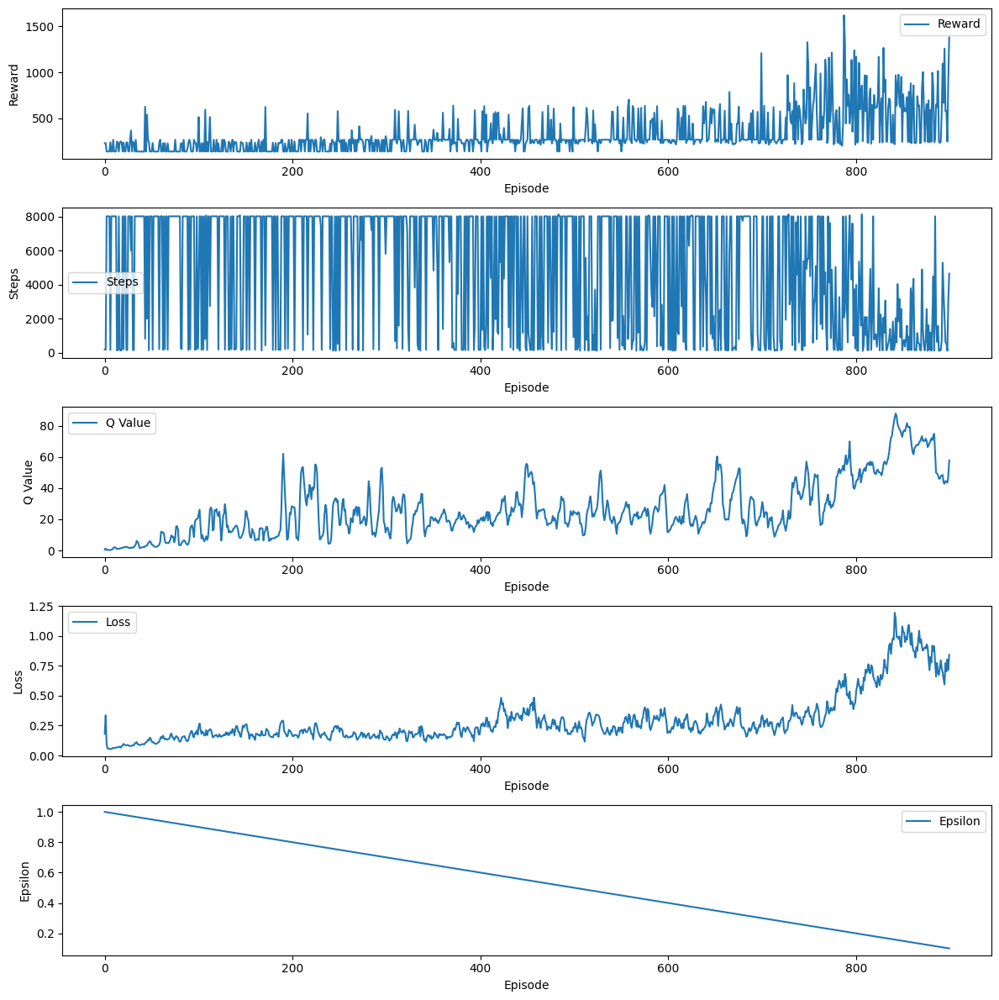

Episode 901 abgeschlossen mit 1156 Schritten, Gesamtbelohnung: 1317.0, Epsilon: 0.0999999999999992


Episode 902 abgeschlossen mit 626 Schritten, Gesamtbelohnung: 615.0, Epsilon: 0.0989999999999992


Episode 903 abgeschlossen mit 136 Schritten, Gesamtbelohnung: 252.0, Epsilon: 0.0979999999999992


Episode 904 abgeschlossen mit 1373 Schritten, Gesamtbelohnung: 1306.0, Epsilon: 0.0969999999999992


Episode 905 abgeschlossen mit 824 Schritten, Gesamtbelohnung: 626.0, Epsilon: 0.0959999999999992


Episode 906 abgeschlossen mit 170 Schritten, Gesamtbelohnung: 233.0, Epsilon: 0.0949999999999992


Episode 907 abgeschlossen mit 1570 Schritten, Gesamtbelohnung: 765.0, Epsilon: 0.0939999999999992


Episode 908 abgeschlossen mit 136 Schritten, Gesamtbelohnung: 245.0, Epsilon: 0.0929999999999992


Episode 909 abgeschlossen mit 136 Schritten, Gesamtbelohnung: 252.0, Epsilon: 0.0919999999999992


Episode 910 abgeschlossen mit 2360 Schritten, Gesamtbelohnung: 629.0, Epsilon: 0.09099999999999919


Epi

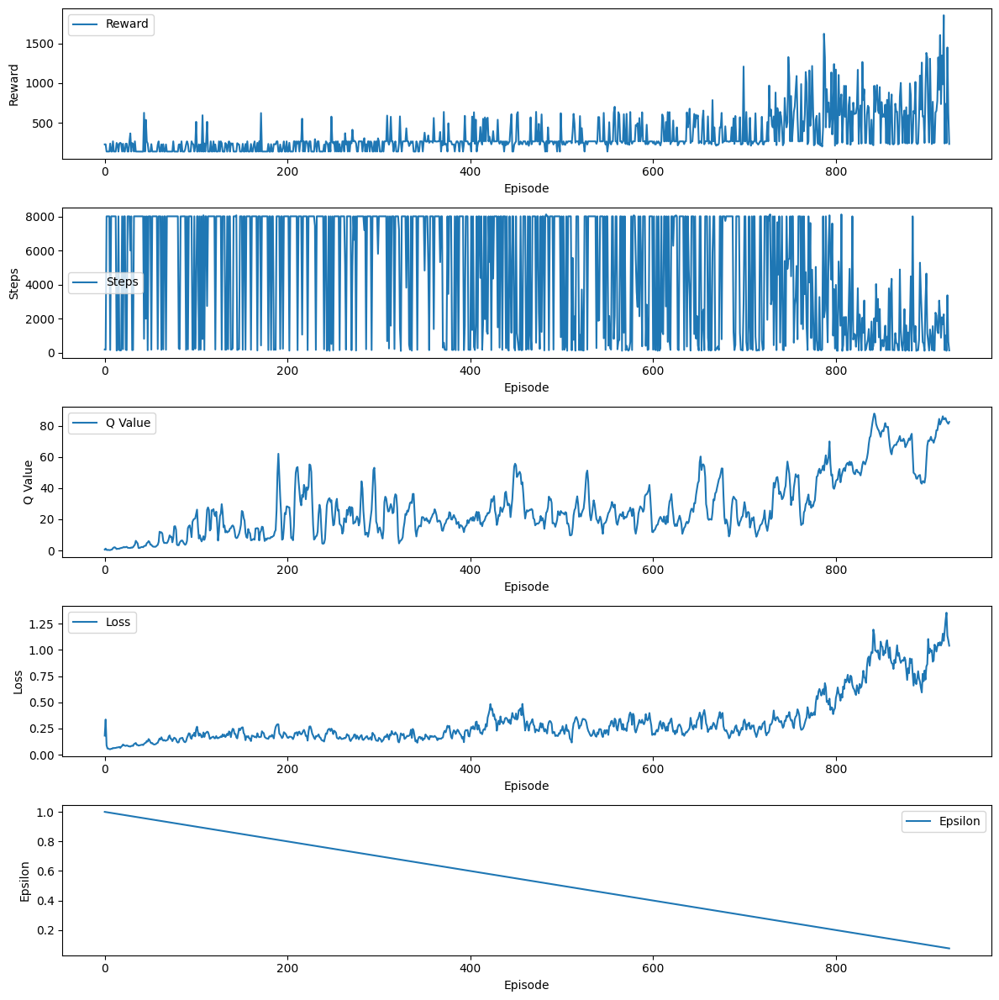

Episode 926 abgeschlossen mit 364 Schritten, Gesamtbelohnung: 610.0, Epsilon: 0.07499999999999918


Episode 927 abgeschlossen mit 156 Schritten, Gesamtbelohnung: 247.0, Epsilon: 0.07399999999999918


Episode 928 abgeschlossen mit 1337 Schritten, Gesamtbelohnung: 1291.0, Epsilon: 0.07299999999999918


Episode 929 abgeschlossen mit 120 Schritten, Gesamtbelohnung: 247.0, Epsilon: 0.07199999999999918


Episode 930 abgeschlossen mit 166 Schritten, Gesamtbelohnung: 231.0, Epsilon: 0.07099999999999917


Episode 931 abgeschlossen mit 154 Schritten, Gesamtbelohnung: 235.0, Epsilon: 0.06999999999999917


Episode 932 abgeschlossen mit 160 Schritten, Gesamtbelohnung: 234.0, Epsilon: 0.06899999999999917


Episode 933 abgeschlossen mit 582 Schritten, Gesamtbelohnung: 585.0, Epsilon: 0.06799999999999917


Episode 934 abgeschlossen mit 498 Schritten, Gesamtbelohnung: 773.0, Epsilon: 0.06699999999999917


Episode 935 abgeschlossen mit 142 Schritten, Gesamtbelohnung: 237.0, Epsilon: 0.06599999999999917


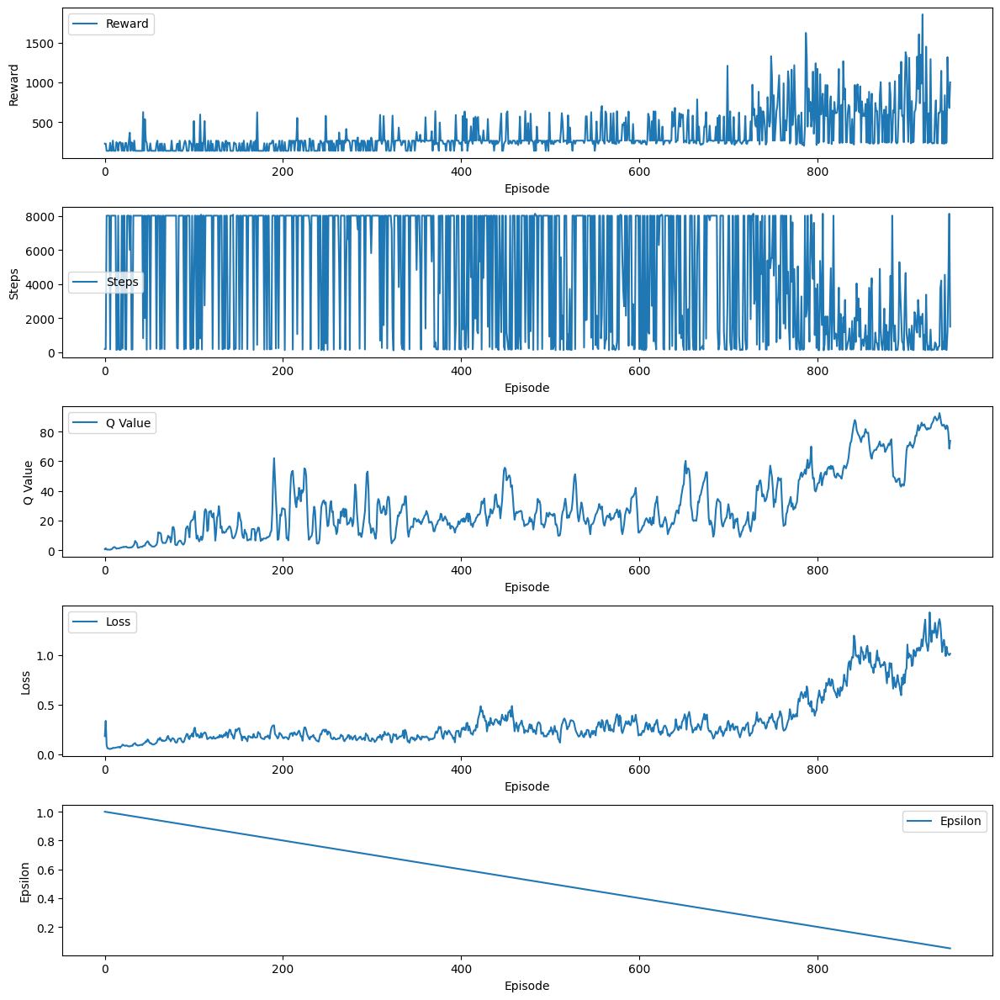

Episode 951 abgeschlossen mit 2716 Schritten, Gesamtbelohnung: 678.0, Epsilon: 0.049999999999999156


Episode 952 abgeschlossen mit 156 Schritten, Gesamtbelohnung: 233.0, Epsilon: 0.048999999999999155


Episode 953 abgeschlossen mit 7182 Schritten, Gesamtbelohnung: 427.0, Epsilon: 0.047999999999999154


Episode 954 abgeschlossen mit 256 Schritten, Gesamtbelohnung: 180.0, Epsilon: 0.046999999999999154


Episode 955 abgeschlossen mit 8019 Schritten, Gesamtbelohnung: 267.0, Epsilon: 0.04599999999999915


Episode 956 abgeschlossen mit 2570 Schritten, Gesamtbelohnung: 518.0, Epsilon: 0.04499999999999915


Episode 957 abgeschlossen mit 460 Schritten, Gesamtbelohnung: 621.0, Epsilon: 0.04399999999999915


Episode 958 abgeschlossen mit 2192 Schritten, Gesamtbelohnung: 558.0, Epsilon: 0.04299999999999915


Episode 959 abgeschlossen mit 1086 Schritten, Gesamtbelohnung: 789.0, Epsilon: 0.04199999999999915


Episode 960 abgeschlossen mit 846 Schritten, Gesamtbelohnung: 736.0, Epsilon: 0.0409999999

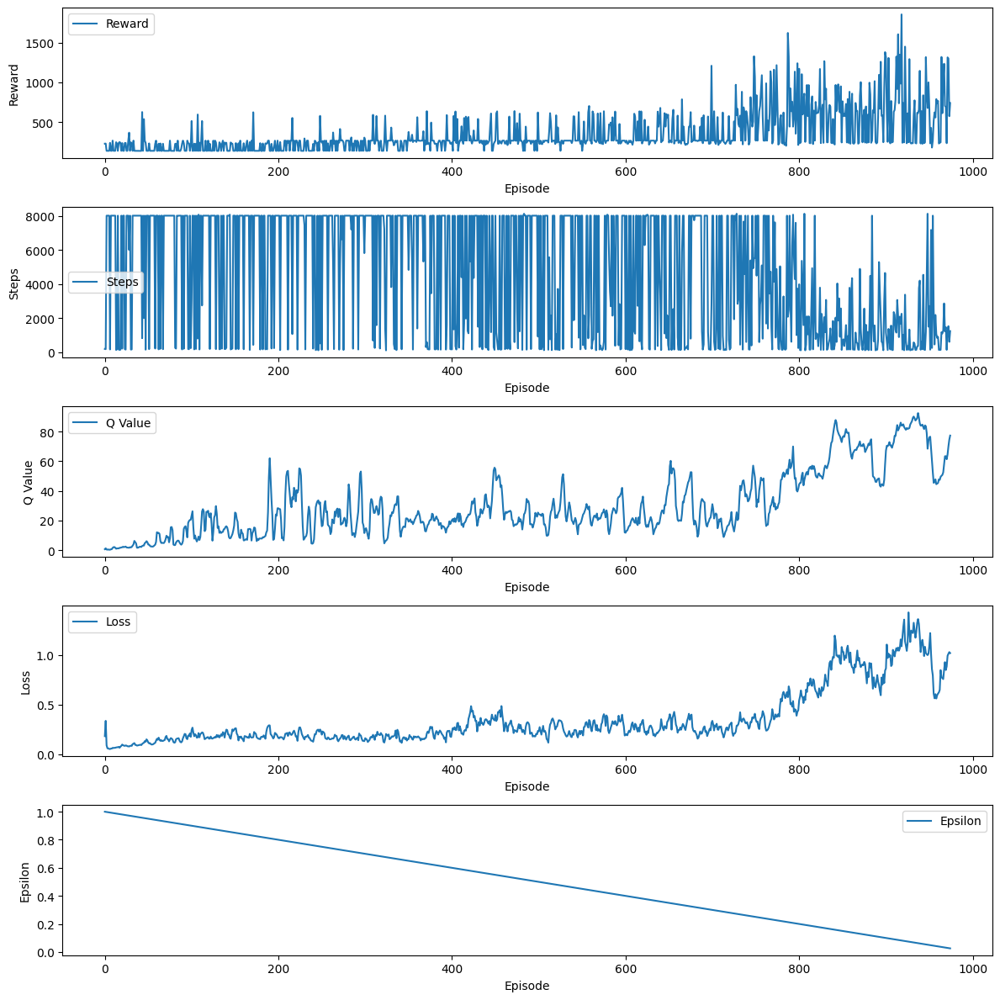

Episode 976 abgeschlossen mit 604 Schritten, Gesamtbelohnung: 637.0, Epsilon: 0.024999999999999134


Episode 977 abgeschlossen mit 150 Schritten, Gesamtbelohnung: 232.0, Epsilon: 0.023999999999999133


Episode 978 abgeschlossen mit 646 Schritten, Gesamtbelohnung: 635.0, Epsilon: 0.022999999999999132


Episode 979 abgeschlossen mit 146 Schritten, Gesamtbelohnung: 231.0, Epsilon: 0.02199999999999913


Episode 980 abgeschlossen mit 162 Schritten, Gesamtbelohnung: 231.0, Epsilon: 0.02099999999999913


Episode 981 abgeschlossen mit 372 Schritten, Gesamtbelohnung: 605.0, Epsilon: 0.01999999999999913


Episode 982 abgeschlossen mit 316 Schritten, Gesamtbelohnung: 606.0, Epsilon: 0.01899999999999913


Episode 983 abgeschlossen mit 784 Schritten, Gesamtbelohnung: 628.0, Epsilon: 0.017999999999999128


Episode 984 abgeschlossen mit 1286 Schritten, Gesamtbelohnung: 715.0, Epsilon: 0.016999999999999127


Episode 985 abgeschlossen mit 1676 Schritten, Gesamtbelohnung: 1824.0, Epsilon: 0.015999999999

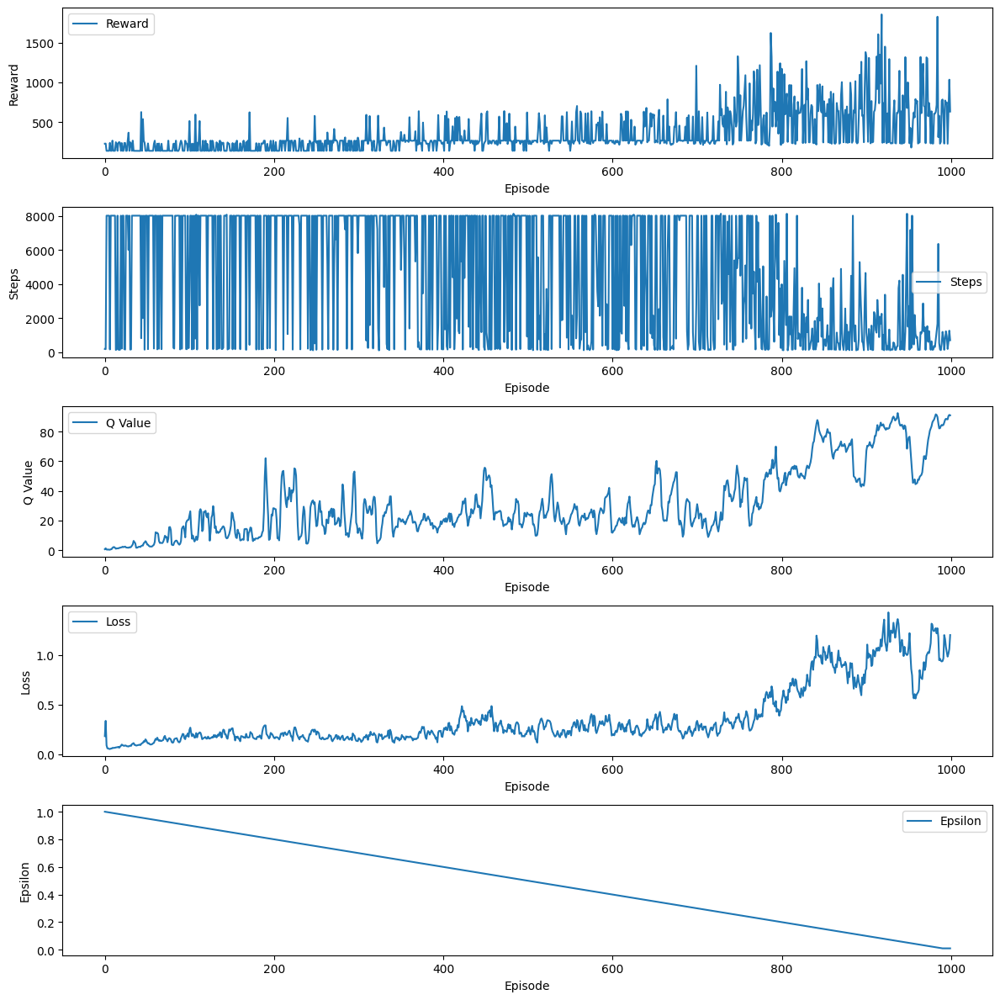

In [5]:
for episode in range(1, num_episodes + 1):
    state = env.reset()
    total_reward = 0
    steps = 0
    mean_episode_q = []
    mean_episode_loss = []
    # Initiate loop for the current episode to play the game until it ends
    while True:
        # To visualize the training, uncomment the following line
        # env.render()
        action = mario.selectAction(state)
        next_state, reward, resetnow, info = env.step(action)
        mario.saveExp(state, action, next_state, reward, resetnow)
        q, loss = mario.learn_get_TDest_loss()
        state = next_state
        total_reward = total_reward + reward
        steps = steps + 1
        mean_episode_q.append(q)
        mean_episode_loss.append(loss)
        if resetnow or info["flag_get"]:
            break
    print(
        f"Episode {episode} abgeschlossen mit {steps} Schritten, Gesamtbelohnung: {total_reward}, Epsilon: {mario.epsilon}\n\n"
    )
    # Save the results of the current episode
    reward_list.append(total_reward)
    steps_list.append(steps)
    q_list.append(np.mean(mean_episode_q))
    loss_list.append(np.mean(mean_episode_loss))
    epsilon_list.append(mario.epsilon)

    # Plot the results of all episodes at the defined intervals
    if episode % plot_every == 0:
        plot_results(
            reward_list,
            steps_list,
            q_list,
            loss_list,
            epsilon_list,
            os.path.join(plot_folder, f"plot_{episode}.png"),
        )

    # Save the model at the defined intervals
    if episode % save_every == 0:
        torch.save(
            dict(
                model=mario.model.state_dict(),
                optimizer=mario.optimizer.state_dict(),
                epsilon=mario.epsilon,
            ),
            os.path.join(checkpoint_folder, f"model_ep{episode}.pth"),
        )

    # Decay the epsilon value at the end of each episode
    mario.decayEpsilon(strat="lin")

# Save the final model after all episodes are completed
torch.save(
    dict(
        model=mario.model.state_dict(),
        optimizer=mario.optimizer.state_dict(),
        epsilon=mario.epsilon,
    ),
    os.path.join(model_folder, f"final_model.pth"),
)

# Close the environment
env.close()